# CT7160NI Computer Vision Coursework
## 04 - Model Evaluation & Performance Metrics

**Project:** Deep Learning-Based Plant Species Classification  
**Dataset:** Oxford 102 Flower Dataset  
**Author:** Rishav Singh  
**Date:** 2024

---

This notebook provides comprehensive evaluation of all three trained models:
1. **Baseline CNN (Improved)** - Custom architecture trained from scratch (Best Val Acc: 85.83%)
2. **ResNet50** - Transfer learning with two-phase training (Best Val Acc: 98.53%)
3. **EfficientNet-B3** - Efficient architecture with compound scaling (Best Val Acc: 99.19%)

### Contents
1. Setup and Imports
2. Configuration
3. Load All Models
4. Prepare Test DataLoaders
5. Evaluate Baseline CNN
6. Evaluate ResNet50
7. Evaluate EfficientNet-B3
8. Model Comparison & Visualizations
9. Error Analysis
10. Summary & Conclusions

---

**Note:** This notebook evaluates models that have already been trained. Model checkpoints should be available in `results/models/`.

In [21]:
# Setup: Add project root to Python path
import sys
from pathlib import Path

# Try multiple strategies to find the project root
notebook_dir = Path().resolve()
project_root = None

# Strategy 1: If we're in notebooks/, parent is project root
if notebook_dir.name == 'notebooks' and (notebook_dir.parent / 'src').exists():
    project_root = notebook_dir.parent
# Strategy 2: Check if current directory is project root
elif (notebook_dir / 'src').exists():
    project_root = notebook_dir
# Strategy 3: Check parent directory
elif (notebook_dir.parent / 'src').exists():
    project_root = notebook_dir.parent
# Strategy 4: Walk up directory tree to find src
else:
    current = notebook_dir
    while current != current.parent:
        if (current / 'src').exists():
            project_root = current
            break
        current = current.parent

if project_root:
    if str(project_root) not in sys.path:
        sys.path.insert(0, str(project_root))
    print(f"✓ Project root found: {project_root}")
else:
    print("⚠ Warning: Could not find project root. Trying default path...")
    # Fallback: assume parent if in notebooks/
    if notebook_dir.name == 'notebooks':
        fallback = notebook_dir.parent
    else:
        fallback = notebook_dir
    if str(fallback) not in sys.path:
        sys.path.insert(0, str(fallback))
    print(f"✓ Using fallback path: {fallback}")

✓ Project root found: D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification


In [22]:
# Import Libraries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
from pathlib import Path
from PIL import Image
import time
import warnings
warnings.filterwarnings('ignore')

# PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader

# Evaluation
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, classification_report, roc_auc_score,
    roc_curve, auc, precision_recall_curve, average_precision_score,
    top_k_accuracy_score, cohen_kappa_score
)
from sklearn.preprocessing import label_binarize
from sklearn.manifold import TSNE

# Model analysis
try:
    from thop import profile, clever_format  # For FLOPs calculation
    THOP_AVAILABLE = True
except ImportError:
    THOP_AVAILABLE = False
    print("⚠ thop not available. FLOPs calculation will be skipped.")

# Dataset and transforms
from src.data.dataset import FlowerDataset
from src.data.augmentation import get_val_transforms, AlbumentationsTransform
from src.data.data_loader import create_dataloaders

# Models
from src.models.baseline_cnn import BaselineCNN
from src.models.resnet_model import ResNetClassifier
from src.models.efficientnet_model import EfficientNetClassifier

# Evaluation utilities
from src.evaluation.metrics import get_predictions, calculate_metrics, analyze_errors
from src.evaluation.visualization import (
    plot_confusion_matrix,
    plot_roc_curves,
    plot_per_class_performance,
    plot_misclassified_examples
)

# Set style for plots
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 11
sns.set_palette("husl")

# Configuration
notebook_dir = Path().resolve()
if notebook_dir.name == 'notebooks':
    PROJECT_ROOT = notebook_dir.parent
else:
    PROJECT_ROOT = notebook_dir

DATA_DIR = PROJECT_ROOT / 'data/raw/oxford_flowers_102'
OUTPUT_DIR = PROJECT_ROOT / 'results/evaluation'
MODELS_DIR = PROJECT_ROOT / 'results/models'
FIGURES_DIR = PROJECT_ROOT / 'results/figures'

# Create output directories
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
FIGURES_DIR.mkdir(parents=True, exist_ok=True)

# Model paths
BASELINE_MODEL_PATH = MODELS_DIR / 'baseline_cnn_improved_no_masks_best.pth'
RESNET50_MODEL_PATH = MODELS_DIR / 'resnet50_best.pth'
EFFICIENTNET_MODEL_PATH = MODELS_DIR / 'efficientnet_b3_best.pth'

# Evaluation parameters
BATCH_SIZE = 32
NUM_WORKERS = 4
NUM_CLASSES = 102

# Device configuration
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"✓ Using device: {device}")
if device == 'cuda':
    print(f"✓ GPU: {torch.cuda.get_device_name(0)}")
    
print(f"✓ Project root: {PROJECT_ROOT}")
print(f"✓ Data directory: {DATA_DIR}")
print(f"✓ Models directory: {MODELS_DIR}")
print(f"✓ Output directory: {OUTPUT_DIR}")

✓ Using device: cuda
✓ GPU: NVIDIA GeForce RTX 2050
✓ Project root: D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification
✓ Data directory: D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\data\raw\oxford_flowers_102
✓ Models directory: D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\models
✓ Output directory: D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\evaluation


## 3. Load All Models

Load the trained Baseline CNN, ResNet50, and EfficientNet-B3 models from their checkpoints.

In [23]:
# Load Baseline CNN (Improved)
print("Loading Baseline CNN (Improved) model...")
baseline_model = None
baseline_checkpoint = None
if BASELINE_MODEL_PATH.exists():
    try:
        baseline_checkpoint = torch.load(BASELINE_MODEL_PATH, map_location=device, weights_only=False)
        # Load with correct configuration: improved=True, dropout=0.5
        baseline_model = BaselineCNN(num_classes=NUM_CLASSES, dropout=0.5, improved=True)
        baseline_model.load_state_dict(baseline_checkpoint['model_state_dict'])
        baseline_model.to(device)
        baseline_model.eval()
        
        baseline_params = sum(p.numel() for p in baseline_model.parameters())
        baseline_best_val_acc = baseline_checkpoint.get('best_val_acc', baseline_checkpoint.get('val_acc', 0))
        baseline_best_val_loss = baseline_checkpoint.get('best_val_loss', baseline_checkpoint.get('val_loss', float('inf')))
        baseline_epoch = baseline_checkpoint.get('epoch', 0)
        
        print(f"✓ Baseline CNN (Improved) loaded successfully")
        print(f"  Parameters: {baseline_params:,}")
        print(f"  Best validation accuracy (training): {baseline_best_val_acc:.2f}%")
        print(f"  Best validation loss (training): {baseline_best_val_loss:.4f}")
        print(f"  Training epoch: {baseline_epoch}")
    except Exception as e:
        print(f"⚠ Error loading Baseline CNN: {e}")
        import traceback
        traceback.print_exc()
        baseline_model = None
else:
    print(f"⚠ Baseline CNN model not found at {BASELINE_MODEL_PATH}")
    print(f"  Expected path: {BASELINE_MODEL_PATH}")

Loading Baseline CNN (Improved) model...
✓ Baseline CNN (Improved) loaded successfully
  Parameters: 11,909,894
  Best validation accuracy (training): 85.83%
  Best validation loss (training): inf
  Training epoch: 0


In [24]:
# Load ResNet50
print("\nLoading ResNet50 model...")
resnet50_model = None
resnet50_checkpoint = None
if RESNET50_MODEL_PATH.exists():
    try:
        resnet50_checkpoint = torch.load(RESNET50_MODEL_PATH, map_location=device, weights_only=False)
        # Load with correct configuration: pretrained=True, dropout=0.3
        resnet50_model = ResNetClassifier(num_classes=NUM_CLASSES, pretrained=True, dropout=0.3, freeze_backbone=False)
        resnet50_model.load_state_dict(resnet50_checkpoint['model_state_dict'])
        resnet50_model.to(device)
        resnet50_model.eval()
        
        resnet50_params = sum(p.numel() for p in resnet50_model.parameters())
        resnet50_best_val_acc = resnet50_checkpoint.get('best_val_acc', resnet50_checkpoint.get('val_acc', 0))
        resnet50_best_val_loss = resnet50_checkpoint.get('best_val_loss', resnet50_checkpoint.get('val_loss', float('inf')))
        resnet50_epoch = resnet50_checkpoint.get('epoch', 0)
        
        print(f"✓ ResNet50 loaded successfully")
        print(f"  Parameters: {resnet50_params:,}")
        print(f"  Best validation accuracy (training): {resnet50_best_val_acc:.2f}%")
        print(f"  Best validation loss (training): {resnet50_best_val_loss:.4f}")
        print(f"  Training epoch: {resnet50_epoch}")
    except Exception as e:
        print(f"⚠ Error loading ResNet50: {e}")
        import traceback
        traceback.print_exc()
        resnet50_model = None
else:
    print(f"⚠ ResNet50 model not found at {RESNET50_MODEL_PATH}")
    print(f"  Expected path: {RESNET50_MODEL_PATH}")


Loading ResNet50 model...
Loaded ResNet50 with ImageNet pre-trained weights
✓ ResNet50 loaded successfully
  Parameters: 24,609,446
  Best validation accuracy (training): 98.53%
  Best validation loss (training): inf
  Training epoch: 0


In [25]:
# Load EfficientNet-B3
print("\nLoading EfficientNet-B3 model...")
efficientnet_model = None
efficientnet_checkpoint = None
if EFFICIENTNET_MODEL_PATH.exists():
    try:
        efficientnet_checkpoint = torch.load(EFFICIENTNET_MODEL_PATH, map_location=device, weights_only=False)
        # Load with correct configuration: model_name='efficientnet_b3', pretrained=True, dropout=0.3
        efficientnet_model = EfficientNetClassifier(
            num_classes=NUM_CLASSES, 
            model_name='efficientnet_b3',
            pretrained=True, 
            dropout=0.3,
            freeze_backbone=False
        )
        efficientnet_model.load_state_dict(efficientnet_checkpoint['model_state_dict'])
        efficientnet_model.to(device)
        efficientnet_model.eval()
        
        efficientnet_params = sum(p.numel() for p in efficientnet_model.parameters())
        efficientnet_best_val_acc = efficientnet_checkpoint.get('best_val_acc', efficientnet_checkpoint.get('val_acc', 0))
        efficientnet_best_val_loss = efficientnet_checkpoint.get('best_val_loss', efficientnet_checkpoint.get('val_loss', float('inf')))
        efficientnet_epoch = efficientnet_checkpoint.get('epoch', 0)
        
        print(f"✓ EfficientNet-B3 loaded successfully")
        print(f"  Parameters: {efficientnet_params:,}")
        print(f"  Best validation accuracy (training): {efficientnet_best_val_acc:.2f}%")
        print(f"  Best validation loss (training): {efficientnet_best_val_loss:.4f}")
        print(f"  Training epoch: {efficientnet_epoch}")
        print(f"  Recommended input size: 300×300")
    except Exception as e:
        print(f"⚠ Error loading EfficientNet-B3: {e}")
        import traceback
        traceback.print_exc()
        efficientnet_model = None
else:
    print(f"⚠ EfficientNet-B3 model not found at {EFFICIENTNET_MODEL_PATH}")
    print(f"  Expected path: {EFFICIENTNET_MODEL_PATH}")


Loading EfficientNet-B3 model...
Loaded efficientnet_b3 with ImageNet pre-trained weights
Backbone output features: 1536
✓ EfficientNet-B3 loaded successfully
  Parameters: 11,115,918
  Best validation accuracy (training): 99.19%
  Best validation loss (training): inf
  Training epoch: 0
  Recommended input size: 300×300


## 4. Prepare Test DataLoaders

Create test DataLoaders for each model. Note that EfficientNet-B3 uses 300x300 images while Baseline CNN and ResNet50 use 224x224.

In [26]:
# Create test DataLoader for Baseline CNN and ResNet50 (224x224)
print("Creating test DataLoader for Baseline CNN and ResNet50 (224x224)...")
if DATA_DIR.exists():
    val_transform_224 = get_val_transforms(image_size=224, use_albumentations=True)
    val_transform_wrapper_224 = AlbumentationsTransform(val_transform_224)
    
    test_dataset_224 = FlowerDataset(
        root_dir=str(DATA_DIR),
        split='test',
        transform=val_transform_wrapper_224
    )
    
    test_loader_224 = DataLoader(
        test_dataset_224,
        batch_size=BATCH_SIZE,
        shuffle=False,
        num_workers=NUM_WORKERS,
        pin_memory=True if torch.cuda.is_available() else False
    )
    
    print(f"✓ Test dataset (224x224) created")
    print(f"  Test samples: {len(test_dataset_224):,}")
    print(f"  Test batches: {len(test_loader_224)}")
else:
    print(f"⚠ Data directory not found at {DATA_DIR}")
    test_dataset_224 = None
    test_loader_224 = None

Creating test DataLoader for Baseline CNN and ResNet50 (224x224)...
✓ Test dataset (224x224) created
  Test samples: 1,229
  Test batches: 39


In [27]:
# Create test DataLoader for EfficientNet-B3 (300x300)
print("\nCreating test DataLoader for EfficientNet-B3 (300x300)...")
if DATA_DIR.exists():
    val_transform_300 = get_val_transforms(image_size=300, use_albumentations=True)
    val_transform_wrapper_300 = AlbumentationsTransform(val_transform_300)
    
    test_dataset_300 = FlowerDataset(
        root_dir=str(DATA_DIR),
        split='test',
        transform=val_transform_wrapper_300
    )
    
    test_loader_300 = DataLoader(
        test_dataset_300,
        batch_size=BATCH_SIZE,
        shuffle=False,
        num_workers=NUM_WORKERS,
        pin_memory=True if torch.cuda.is_available() else False
    )
    
    print(f"✓ Test dataset (300x300) created")
    print(f"  Test samples: {len(test_dataset_300):,}")
    print(f"  Test batches: {len(test_loader_300)}")
else:
    test_dataset_300 = None
    test_loader_300 = None


Creating test DataLoader for EfficientNet-B3 (300x300)...
✓ Test dataset (300x300) created
  Test samples: 1,229
  Test batches: 39


## 5. Evaluate Baseline CNN

Get predictions and calculate comprehensive metrics for the Baseline CNN model.

In [28]:
# Evaluate Baseline CNN
if baseline_model is not None and test_loader_224 is not None:
    print("=" * 80)
    print("BASELINE CNN EVALUATION")
    print("=" * 80)
    
    print("\nGetting predictions on test set...")
    start_time = time.time()
    baseline_results = get_predictions(baseline_model, test_loader_224, device=device)
    inference_time = time.time() - start_time
    
    print(f"✓ Inference completed in {inference_time:.2f} seconds")
    print(f"  Average inference time: {inference_time/len(test_dataset_224)*1000:.2f} ms/image")
    
    # Calculate metrics
    print("\nCalculating metrics...")
    baseline_metrics = calculate_metrics(
        predictions=baseline_results['predictions'],
        true_labels=baseline_results['true_labels'],
        probabilities=baseline_results['probabilities'],
        num_classes=NUM_CLASSES
    )
    
    print("\n" + "=" * 80)
    print("BASELINE CNN TEST SET RESULTS")
    print("=" * 80)
    print(f"Overall Accuracy: {baseline_metrics['accuracy']:.2f}%")
    if baseline_metrics.get('top_5_accuracy'):
        print(f"Top-5 Accuracy: {baseline_metrics['top_5_accuracy']:.2f}%")
    print(f"Precision (Macro): {baseline_metrics['precision_macro']:.2f}%")
    print(f"Precision (Micro): {baseline_metrics['precision_micro']:.2f}%")
    print(f"Recall (Macro): {baseline_metrics['recall_macro']:.2f}%")
    print(f"Recall (Micro): {baseline_metrics['recall_micro']:.2f}%")
    print(f"F1-Score (Macro): {baseline_metrics['f1_macro']:.2f}%")
    print(f"F1-Score (Micro): {baseline_metrics['f1_micro']:.2f}%")
    if baseline_metrics.get('roc_auc_macro'):
        print(f"ROC-AUC (Macro): {baseline_metrics['roc_auc_macro']:.4f}")
    print(f"\nTest Samples: {len(baseline_results['true_labels']):,}")
    print("=" * 80)
    
    # Store inference time
    baseline_inference_time = inference_time / len(test_dataset_224) * 1000
else:
    print("⚠ Cannot evaluate Baseline CNN: Model or test loader not available")
    baseline_results = None
    baseline_metrics = None
    baseline_inference_time = None

BASELINE CNN EVALUATION

Getting predictions on test set...


Getting predictions: 100%|██████████| 39/39 [00:36<00:00,  1.06it/s]

✓ Inference completed in 36.71 seconds
  Average inference time: 29.87 ms/image

Calculating metrics...

BASELINE CNN TEST SET RESULTS
Overall Accuracy: 86.41%
Top-5 Accuracy: 97.80%
Precision (Macro): 86.99%
Precision (Micro): 86.41%
Recall (Macro): 88.95%
Recall (Micro): 86.41%
F1-Score (Macro): 86.88%
F1-Score (Micro): 86.41%
ROC-AUC (Macro): 0.9971

Test Samples: 1,229


## 6. Evaluate ResNet50

Get predictions and calculate comprehensive metrics for the ResNet50 model.

In [29]:
# Evaluate ResNet50
if resnet50_model is not None and test_loader_224 is not None:
    print("=" * 80)
    print("RESNET50 EVALUATION")
    print("=" * 80)
    
    print("\nGetting predictions on test set...")
    start_time = time.time()
    resnet50_results = get_predictions(resnet50_model, test_loader_224, device=device)
    inference_time = time.time() - start_time
    
    print(f"✓ Inference completed in {inference_time:.2f} seconds")
    print(f"  Average inference time: {inference_time/len(test_dataset_224)*1000:.2f} ms/image")
    
    # Calculate metrics
    print("\nCalculating metrics...")
    resnet50_metrics = calculate_metrics(
        predictions=resnet50_results['predictions'],
        true_labels=resnet50_results['true_labels'],
        probabilities=resnet50_results['probabilities'],
        num_classes=NUM_CLASSES
    )
    
    print("\n" + "=" * 80)
    print("RESNET50 TEST SET RESULTS")
    print("=" * 80)
    print(f"Overall Accuracy: {resnet50_metrics['accuracy']:.2f}%")
    if resnet50_metrics.get('top_5_accuracy'):
        print(f"Top-5 Accuracy: {resnet50_metrics['top_5_accuracy']:.2f}%")
    print(f"Precision (Macro): {resnet50_metrics['precision_macro']:.2f}%")
    print(f"Precision (Micro): {resnet50_metrics['precision_micro']:.2f}%")
    print(f"Recall (Macro): {resnet50_metrics['recall_macro']:.2f}%")
    print(f"Recall (Micro): {resnet50_metrics['recall_micro']:.2f}%")
    print(f"F1-Score (Macro): {resnet50_metrics['f1_macro']:.2f}%")
    print(f"F1-Score (Micro): {resnet50_metrics['f1_micro']:.2f}%")
    if resnet50_metrics.get('roc_auc_macro'):
        print(f"ROC-AUC (Macro): {resnet50_metrics['roc_auc_macro']:.4f}")
    print(f"\nTest Samples: {len(resnet50_results['true_labels']):,}")
    print("=" * 80)
    
    # Store inference time
    resnet50_inference_time = inference_time / len(test_dataset_224) * 1000
else:
    print("⚠ Cannot evaluate ResNet50: Model or test loader not available")
    resnet50_results = None
    resnet50_metrics = None
    resnet50_inference_time = None

RESNET50 EVALUATION

Getting predictions on test set...


Getting predictions: 100%|██████████| 39/39 [00:25<00:00,  1.52it/s]

✓ Inference completed in 25.58 seconds
  Average inference time: 20.82 ms/image

Calculating metrics...

RESNET50 TEST SET RESULTS
Overall Accuracy: 97.97%
Top-5 Accuracy: 99.51%
Precision (Macro): 97.62%
Precision (Micro): 97.97%
Recall (Macro): 97.53%
Recall (Micro): 97.97%
F1-Score (Macro): 97.43%
F1-Score (Micro): 97.97%
ROC-AUC (Macro): 0.9994

Test Samples: 1,229


## 7. Evaluate EfficientNet-B3

Get predictions and calculate comprehensive metrics for the EfficientNet-B3 model.

In [30]:
# Evaluate EfficientNet-B3
if efficientnet_model is not None and test_loader_300 is not None:
    print("=" * 80)
    print("EFFICIENTNET-B3 EVALUATION")
    print("=" * 80)
    
    print("\nGetting predictions on test set...")
    start_time = time.time()
    efficientnet_results = get_predictions(efficientnet_model, test_loader_300, device=device)
    inference_time = time.time() - start_time
    
    print(f"✓ Inference completed in {inference_time:.2f} seconds")
    print(f"  Average inference time: {inference_time/len(test_dataset_300)*1000:.2f} ms/image")
    
    # Calculate metrics
    print("\nCalculating metrics...")
    efficientnet_metrics = calculate_metrics(
        predictions=efficientnet_results['predictions'],
        true_labels=efficientnet_results['true_labels'],
        probabilities=efficientnet_results['probabilities'],
        num_classes=NUM_CLASSES
    )
    
    print("\n" + "=" * 80)
    print("EFFICIENTNET-B3 TEST SET RESULTS")
    print("=" * 80)
    print(f"Overall Accuracy: {efficientnet_metrics['accuracy']:.2f}%")
    if efficientnet_metrics.get('top_5_accuracy'):
        print(f"Top-5 Accuracy: {efficientnet_metrics['top_5_accuracy']:.2f}%")
    print(f"Precision (Macro): {efficientnet_metrics['precision_macro']:.2f}%")
    print(f"Precision (Micro): {efficientnet_metrics['precision_micro']:.2f}%")
    print(f"Recall (Macro): {efficientnet_metrics['recall_macro']:.2f}%")
    print(f"Recall (Micro): {efficientnet_metrics['recall_micro']:.2f}%")
    print(f"F1-Score (Macro): {efficientnet_metrics['f1_macro']:.2f}%")
    print(f"F1-Score (Micro): {efficientnet_metrics['f1_micro']:.2f}%")
    if efficientnet_metrics.get('roc_auc_macro'):
        print(f"ROC-AUC (Macro): {efficientnet_metrics['roc_auc_macro']:.4f}")
    print(f"\nTest Samples: {len(efficientnet_results['true_labels']):,}")
    print("=" * 80)
    
    # Store inference time
    efficientnet_inference_time = inference_time / len(test_dataset_300) * 1000
else:
    print("⚠ Cannot evaluate EfficientNet-B3: Model or test loader not available")
    efficientnet_results = None
    efficientnet_metrics = None
    efficientnet_inference_time = None

EFFICIENTNET-B3 EVALUATION

Getting predictions on test set...


Getting predictions: 100%|██████████| 39/39 [00:29<00:00,  1.32it/s]

✓ Inference completed in 29.62 seconds
  Average inference time: 24.10 ms/image

Calculating metrics...

EFFICIENTNET-B3 TEST SET RESULTS
Overall Accuracy: 98.94%
Top-5 Accuracy: 99.76%
Precision (Macro): 99.03%
Precision (Micro): 98.94%
Recall (Macro): 98.82%
Recall (Micro): 98.94%
F1-Score (Macro): 98.86%
F1-Score (Micro): 98.94%
ROC-AUC (Macro): 0.9993

Test Samples: 1,229


## 8. Model Comparison & Visualizations

Compare all three models and generate comprehensive visualizations.

In [31]:
# Create comparison DataFrame
comparison_data = []

if baseline_metrics is not None:
    comparison_data.append({
        'Model': 'Baseline CNN',
        'Accuracy (%)': baseline_metrics['accuracy'],
        'Top-5 Accuracy (%)': baseline_metrics.get('top_5_accuracy', 0),
        'Precision (Macro) (%)': baseline_metrics['precision_macro'],
        'Recall (Macro) (%)': baseline_metrics['recall_macro'],
        'F1-Score (Macro) (%)': baseline_metrics['f1_macro'],
        'ROC-AUC (Macro)': baseline_metrics.get('roc_auc_macro', 0),
        'Parameters': baseline_params if 'baseline_params' in locals() else 0,
        'Inference Time (ms)': baseline_inference_time if 'baseline_inference_time' in locals() else 0,
        'Image Size': '224×224'
    })

if resnet50_metrics is not None:
    comparison_data.append({
        'Model': 'ResNet50',
        'Accuracy (%)': resnet50_metrics['accuracy'],
        'Top-5 Accuracy (%)': resnet50_metrics.get('top_5_accuracy', 0),
        'Precision (Macro) (%)': resnet50_metrics['precision_macro'],
        'Recall (Macro) (%)': resnet50_metrics['recall_macro'],
        'F1-Score (Macro) (%)': resnet50_metrics['f1_macro'],
        'ROC-AUC (Macro)': resnet50_metrics.get('roc_auc_macro', 0),
        'Parameters': resnet50_params if 'resnet50_params' in locals() else 0,
        'Inference Time (ms)': resnet50_inference_time if 'resnet50_inference_time' in locals() else 0,
        'Image Size': '224×224'
    })

if efficientnet_metrics is not None:
    comparison_data.append({
        'Model': 'EfficientNet-B3',
        'Accuracy (%)': efficientnet_metrics['accuracy'],
        'Top-5 Accuracy (%)': efficientnet_metrics.get('top_5_accuracy', 0),
        'Precision (Macro) (%)': efficientnet_metrics['precision_macro'],
        'Recall (Macro) (%)': efficientnet_metrics['recall_macro'],
        'F1-Score (Macro) (%)': efficientnet_metrics['f1_macro'],
        'ROC-AUC (Macro)': efficientnet_metrics.get('roc_auc_macro', 0),
        'Parameters': efficientnet_params if 'efficientnet_params' in locals() else 0,
        'Inference Time (ms)': efficientnet_inference_time if 'efficientnet_inference_time' in locals() else 0,
        'Image Size': '300×300'
    })

# Note: Additional metrics (Cohen's Kappa, Average Precision, FLOPs, Model Size) 
# will be added in section 8.1 and included in the comprehensive comparison table

if comparison_data:
    comparison_df = pd.DataFrame(comparison_data)
    print("\n" + "=" * 80)
    print("MODEL COMPARISON SUMMARY")
    print("=" * 80)
    print(comparison_df.to_string(index=False))
    print("=" * 80)
    
    # Save comparison to CSV
    comparison_df.to_csv(OUTPUT_DIR / 'model_comparison.csv', index=False)
    print(f"\n✓ Comparison saved to {OUTPUT_DIR / 'model_comparison.csv'}")
else:
    print("⚠ No models available for comparison")


MODEL COMPARISON SUMMARY
          Model  Accuracy (%)  Top-5 Accuracy (%)  Precision (Macro) (%)  Recall (Macro) (%)  F1-Score (Macro) (%)  ROC-AUC (Macro)  Parameters  Inference Time (ms) Image Size
   Baseline CNN     86.411717           97.803092              86.994315           88.945990             86.882387         0.997106    11909894            29.871957    224×224
       ResNet50     97.965826           99.511798              97.619884           97.532169             97.429600         0.999356    24609446            20.816973    224×224
EfficientNet-B3     98.942229           99.755899              99.026131           98.817393             98.859923         0.999287    11115918            24.101556    300×300

✓ Comparison saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\evaluation\model_comparison.csv


✓ Comparison visualization saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\model_comparison_metrics.png


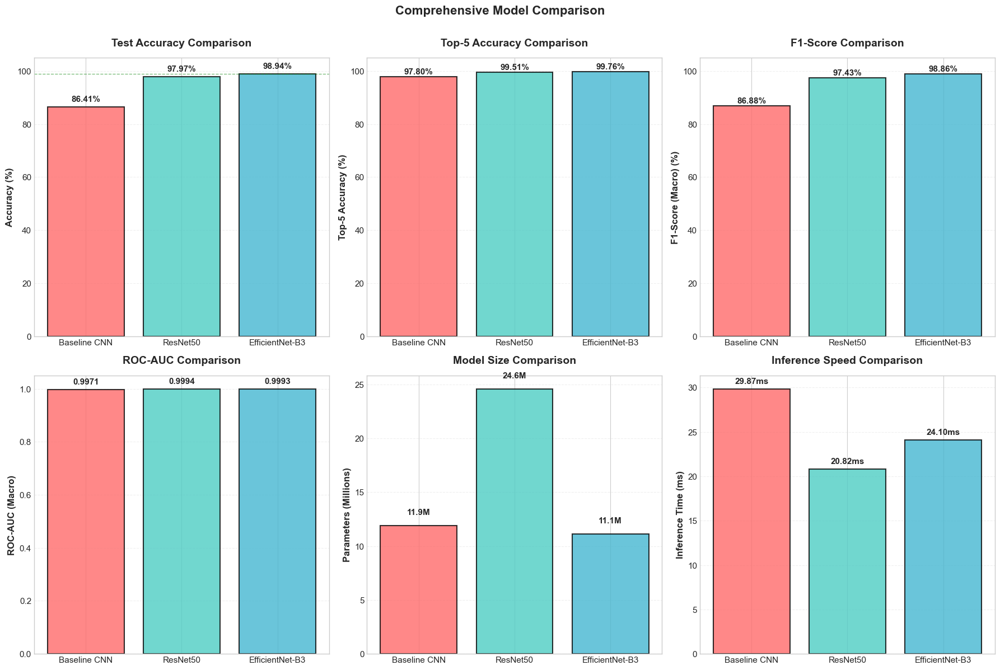


Generating radar chart for multi-dimensional comparison...
✓ Radar chart saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\model_comparison_radar.png


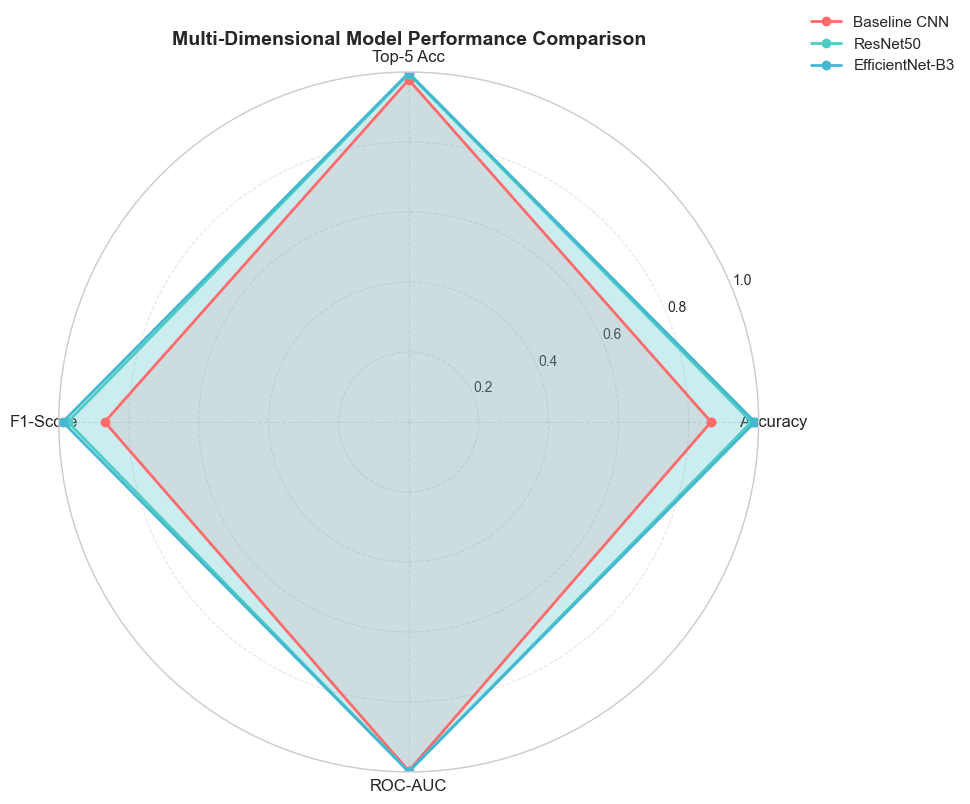

In [32]:
# Visualize comparison metrics
if comparison_data:
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    
    models = comparison_df['Model'].values
    colors = ['#FF6B6B', '#4ECDC4', '#45B7D1']  # Red, Teal, Blue
    
    # Accuracy comparison
    bars1 = axes[0, 0].bar(models, comparison_df['Accuracy (%)'], color=colors, alpha=0.8, edgecolor='black', linewidth=1.5)
    axes[0, 0].set_ylabel('Accuracy (%)', fontsize=12, fontweight='bold')
    axes[0, 0].set_title('Test Accuracy Comparison', fontsize=14, fontweight='bold', pad=15)
    axes[0, 0].grid(True, alpha=0.3, axis='y', linestyle='--')
    axes[0, 0].set_ylim([0, 105])
    for i, (bar, v) in enumerate(zip(bars1, comparison_df['Accuracy (%)'])):
        axes[0, 0].text(bar.get_x() + bar.get_width()/2, v + 2, 
                       f'{v:.2f}%', ha='center', fontweight='bold', fontsize=11)
    axes[0, 0].axhline(y=comparison_df['Accuracy (%)'].max(), color='green', linestyle='--', alpha=0.5, linewidth=1)
    
    # Top-5 Accuracy comparison
    bars2 = axes[0, 1].bar(models, comparison_df['Top-5 Accuracy (%)'], color=colors, alpha=0.8, edgecolor='black', linewidth=1.5)
    axes[0, 1].set_ylabel('Top-5 Accuracy (%)', fontsize=12, fontweight='bold')
    axes[0, 1].set_title('Top-5 Accuracy Comparison', fontsize=14, fontweight='bold', pad=15)
    axes[0, 1].grid(True, alpha=0.3, axis='y', linestyle='--')
    axes[0, 1].set_ylim([0, 105])
    for i, (bar, v) in enumerate(zip(bars2, comparison_df['Top-5 Accuracy (%)'])):
        axes[0, 1].text(bar.get_x() + bar.get_width()/2, v + 1, 
                       f'{v:.2f}%', ha='center', fontweight='bold', fontsize=11)
    
    # F1-Score comparison
    bars3 = axes[0, 2].bar(models, comparison_df['F1-Score (Macro) (%)'], color=colors, alpha=0.8, edgecolor='black', linewidth=1.5)
    axes[0, 2].set_ylabel('F1-Score (Macro) (%)', fontsize=12, fontweight='bold')
    axes[0, 2].set_title('F1-Score Comparison', fontsize=14, fontweight='bold', pad=15)
    axes[0, 2].grid(True, alpha=0.3, axis='y', linestyle='--')
    axes[0, 2].set_ylim([0, 105])
    for i, (bar, v) in enumerate(zip(bars3, comparison_df['F1-Score (Macro) (%)'])):
        axes[0, 2].text(bar.get_x() + bar.get_width()/2, v + 1, 
                       f'{v:.2f}%', ha='center', fontweight='bold', fontsize=11)
    
    # ROC-AUC comparison
    bars4 = axes[1, 0].bar(models, comparison_df['ROC-AUC (Macro)'], color=colors, alpha=0.8, edgecolor='black', linewidth=1.5)
    axes[1, 0].set_ylabel('ROC-AUC (Macro)', fontsize=12, fontweight='bold')
    axes[1, 0].set_title('ROC-AUC Comparison', fontsize=14, fontweight='bold', pad=15)
    axes[1, 0].grid(True, alpha=0.3, axis='y', linestyle='--')
    axes[1, 0].set_ylim([0, 1.05])
    for i, (bar, v) in enumerate(zip(bars4, comparison_df['ROC-AUC (Macro)'])):
        axes[1, 0].text(bar.get_x() + bar.get_width()/2, v + 0.02, 
                       f'{v:.4f}', ha='center', fontweight='bold', fontsize=11)
    
    # Parameters comparison
    bars5 = axes[1, 1].bar(models, comparison_df['Parameters'] / 1e6, color=colors, alpha=0.8, edgecolor='black', linewidth=1.5)
    axes[1, 1].set_ylabel('Parameters (Millions)', fontsize=12, fontweight='bold')
    axes[1, 1].set_title('Model Size Comparison', fontsize=14, fontweight='bold', pad=15)
    axes[1, 1].grid(True, alpha=0.3, axis='y', linestyle='--')
    for i, (bar, v) in enumerate(zip(bars5, comparison_df['Parameters'] / 1e6)):
        axes[1, 1].text(bar.get_x() + bar.get_width()/2, v + 1, 
                       f'{v:.1f}M', ha='center', fontweight='bold', fontsize=11)
    
    # Inference time comparison
    bars6 = axes[1, 2].bar(models, comparison_df['Inference Time (ms)'], color=colors, alpha=0.8, edgecolor='black', linewidth=1.5)
    axes[1, 2].set_ylabel('Inference Time (ms)', fontsize=12, fontweight='bold')
    axes[1, 2].set_title('Inference Speed Comparison', fontsize=14, fontweight='bold', pad=15)
    axes[1, 2].grid(True, alpha=0.3, axis='y', linestyle='--')
    for i, (bar, v) in enumerate(zip(bars6, comparison_df['Inference Time (ms)'])):
        axes[1, 2].text(bar.get_x() + bar.get_width()/2, v + max(comparison_df['Inference Time (ms)']) * 0.02, 
                       f'{v:.2f}ms', ha='center', fontweight='bold', fontsize=11)
    
    plt.suptitle('Comprehensive Model Comparison', fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout(rect=[0, 0, 1, 0.99])
    plt.savefig(FIGURES_DIR / 'model_comparison_metrics.png', dpi=150, bbox_inches='tight')
    print(f"✓ Comparison visualization saved to {FIGURES_DIR / 'model_comparison_metrics.png'}")
    plt.show()
    
    # Create a radar chart for multi-dimensional comparison
    print("\nGenerating radar chart for multi-dimensional comparison...")
    try:
        from math import pi
        
        # Normalize metrics to 0-1 scale for radar chart
        metrics_to_plot = ['Accuracy (%)', 'Top-5 Accuracy (%)', 'F1-Score (Macro) (%)']
        normalized_data = {}
        
        for model in models:
            normalized_data[model] = []
            for metric in metrics_to_plot:
                # Normalize to 0-1 (assuming 100 is max for percentage metrics)
                normalized_data[model].append(comparison_df[comparison_df['Model'] == model][metric].values[0] / 100)
        
        # Add ROC-AUC (already 0-1)
        for model in models:
            roc_auc = comparison_df[comparison_df['Model'] == model]['ROC-AUC (Macro)'].values[0]
            normalized_data[model].append(roc_auc)
        
        # Number of variables
        categories = ['Accuracy', 'Top-5 Acc', 'F1-Score', 'ROC-AUC']
        N = len(categories)
        
        # Compute angle for each axis
        angles = [n / float(N) * 2 * pi for n in range(N)]
        angles += angles[:1]  # Complete the circle
        
        # Create radar chart
        fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(projection='polar'))
        
        for i, model in enumerate(models):
            values = normalized_data[model]
            values += values[:1]  # Complete the circle
            
            ax.plot(angles, values, 'o-', linewidth=2, label=model, color=colors[i])
            ax.fill(angles, values, alpha=0.15, color=colors[i])
        
        # Add category labels
        ax.set_xticks(angles[:-1])
        ax.set_xticklabels(categories, fontsize=12)
        ax.set_ylim(0, 1)
        ax.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
        ax.set_yticklabels(['0.2', '0.4', '0.6', '0.8', '1.0'], fontsize=10)
        ax.grid(True, linestyle='--', alpha=0.5)
        
        plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1), fontsize=11)
        plt.title('Multi-Dimensional Model Performance Comparison', 
                 fontsize=14, fontweight='bold', pad=20)
        
        plt.tight_layout()
        plt.savefig(FIGURES_DIR / 'model_comparison_radar.png', dpi=150, bbox_inches='tight')
        print(f"✓ Radar chart saved to {FIGURES_DIR / 'model_comparison_radar.png'}")
        plt.show()
    except Exception as e:
        print(f"⚠ Could not generate radar chart: {e}")


Generating confusion matrix for Baseline CNN...
Confusion matrix saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\baseline_cnn_confusion_matrix.png


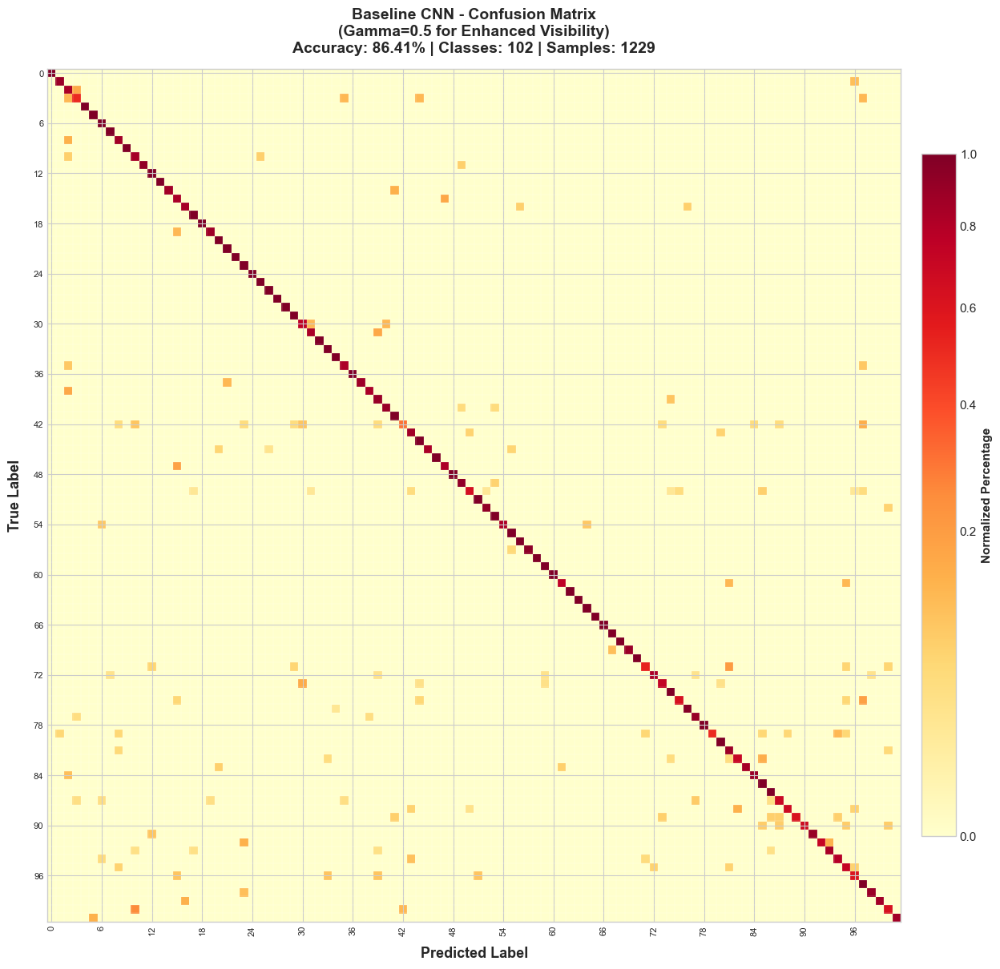


Generating confusion matrix for ResNet50...
Confusion matrix saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\resnet50_confusion_matrix.png


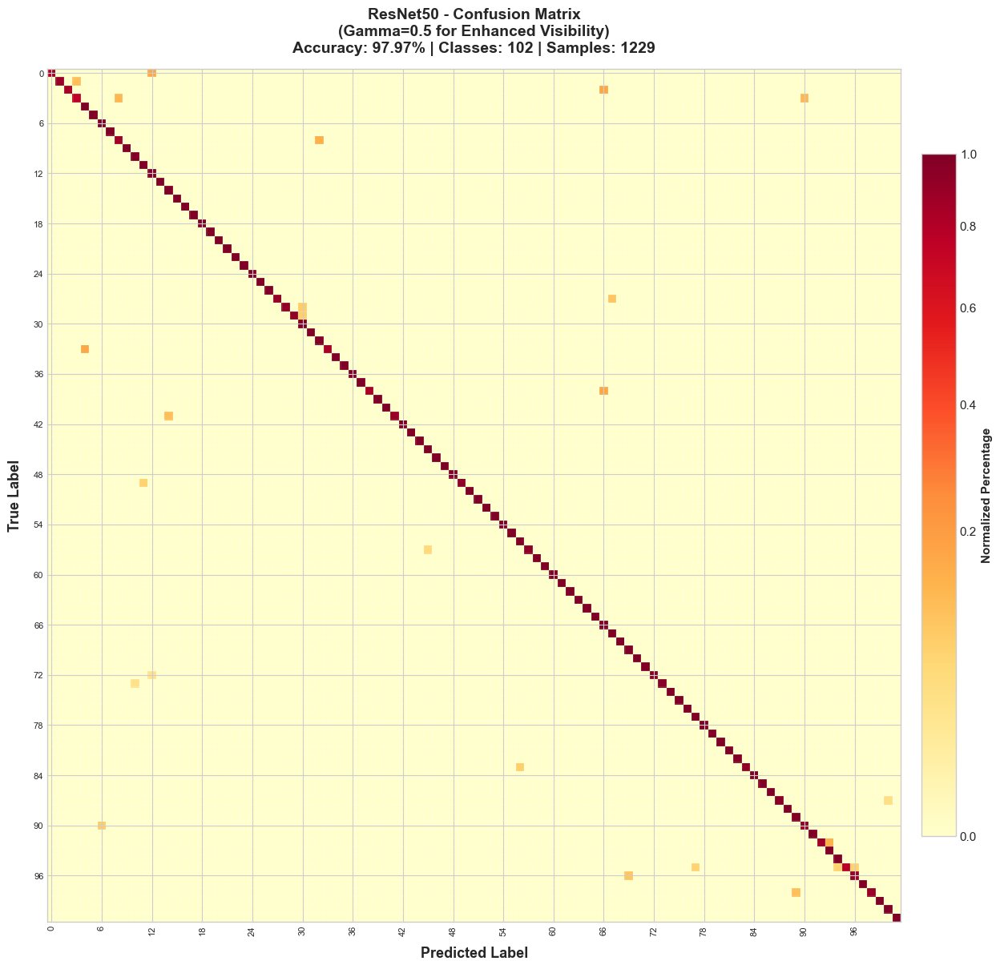


Generating confusion matrix for EfficientNet-B3...
Confusion matrix saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\efficientnet_b3_confusion_matrix.png


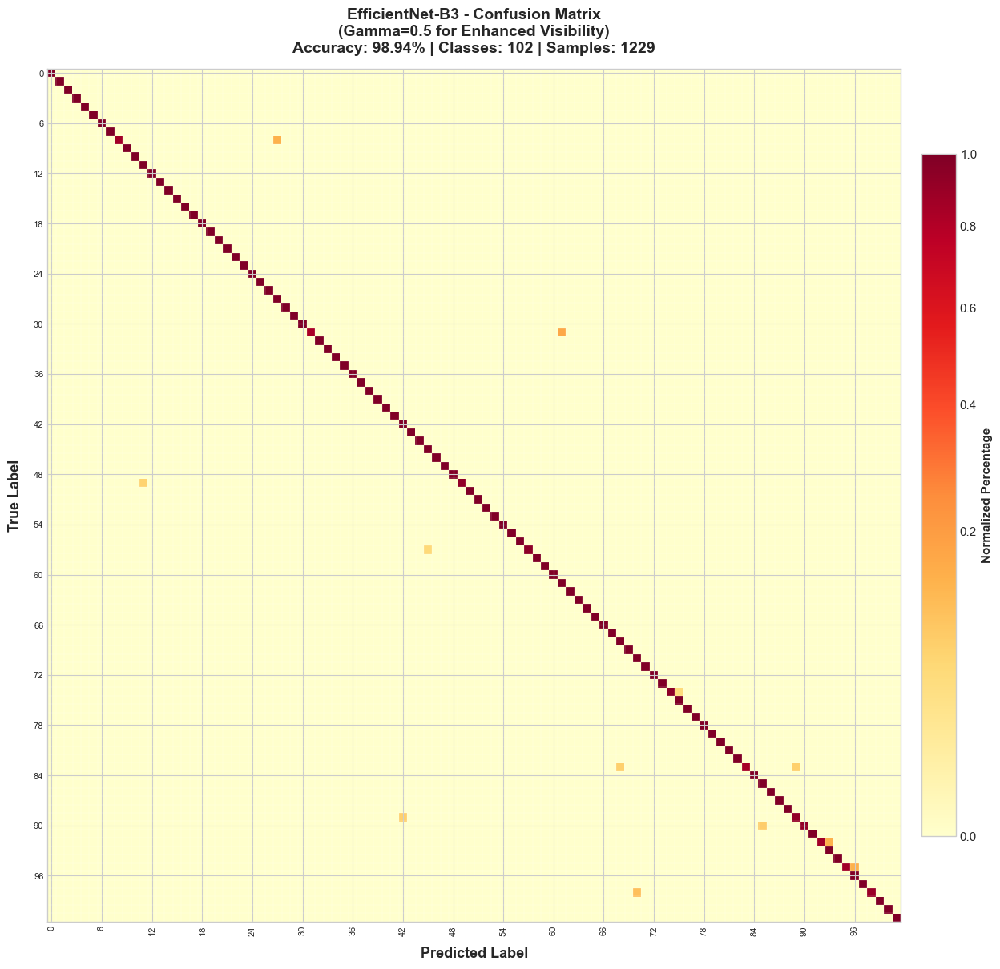

In [33]:
# Plot confusion matrices for each model (one image per model)
if baseline_metrics is not None:
    print("\nGenerating confusion matrix for Baseline CNN...")
    plot_confusion_matrix(
        baseline_metrics['confusion_matrix'],
        normalize=True,
        save_path=FIGURES_DIR / 'baseline_cnn_confusion_matrix.png',
        figsize=(14, 12),
        title='Baseline CNN',
        cmap='YlOrRd',
        gamma=0.5
    )

if resnet50_metrics is not None:
    print("\nGenerating confusion matrix for ResNet50...")
    plot_confusion_matrix(
        resnet50_metrics['confusion_matrix'],
        normalize=True,
        save_path=FIGURES_DIR / 'resnet50_confusion_matrix.png',
        figsize=(14, 12),
        title='ResNet50',
        cmap='YlOrRd',
        gamma=0.5
    )

if efficientnet_metrics is not None:
    print("\nGenerating confusion matrix for EfficientNet-B3...")
    plot_confusion_matrix(
        efficientnet_metrics['confusion_matrix'],
        normalize=True,
        save_path=FIGURES_DIR / 'efficientnet_b3_confusion_matrix.png',
        figsize=(14, 12),
        title='EfficientNet-B3',
        cmap='YlOrRd',
        gamma=0.5
    )


Generating ROC curves for Baseline CNN...
ROC curves saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\baseline_cnn_roc_curves.png


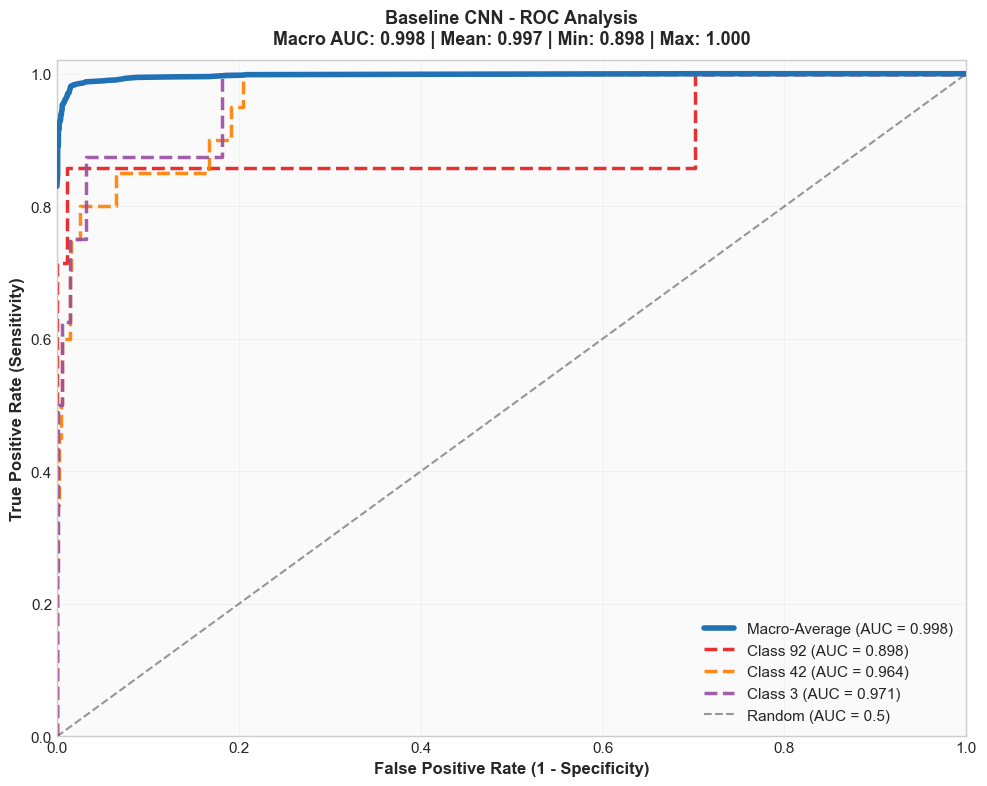


Generating ROC curves for ResNet50...
ROC curves saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\resnet50_roc_curves.png


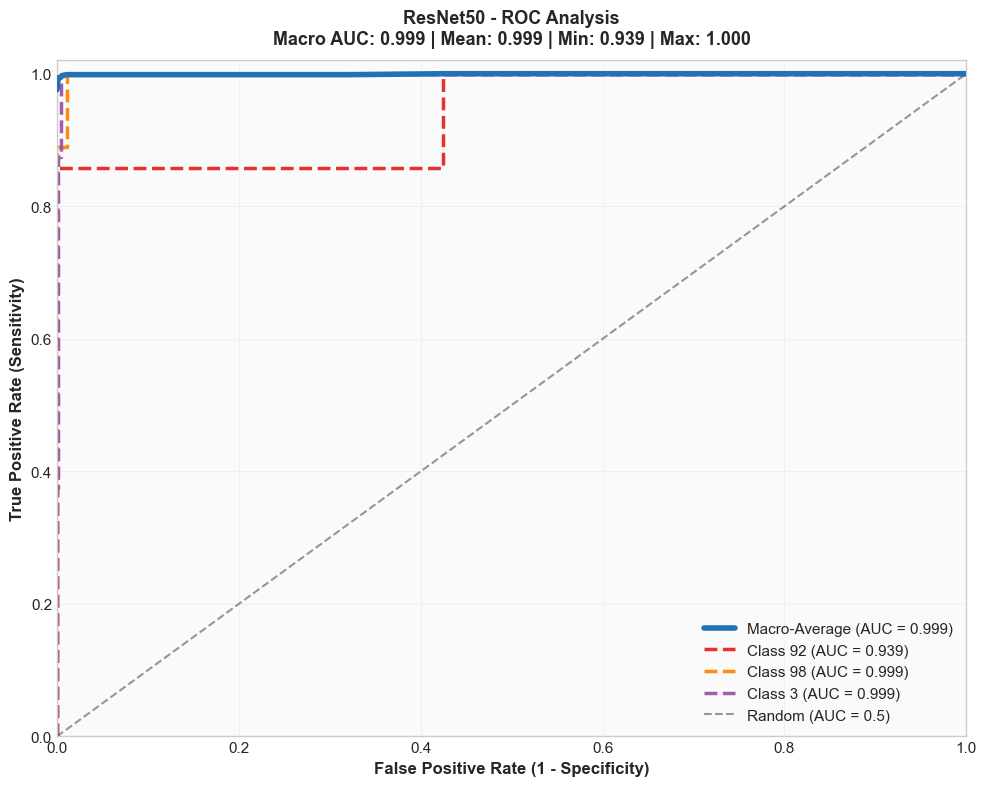


Generating ROC curves for EfficientNet-B3...
ROC curves saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\efficientnet_b3_roc_curves.png


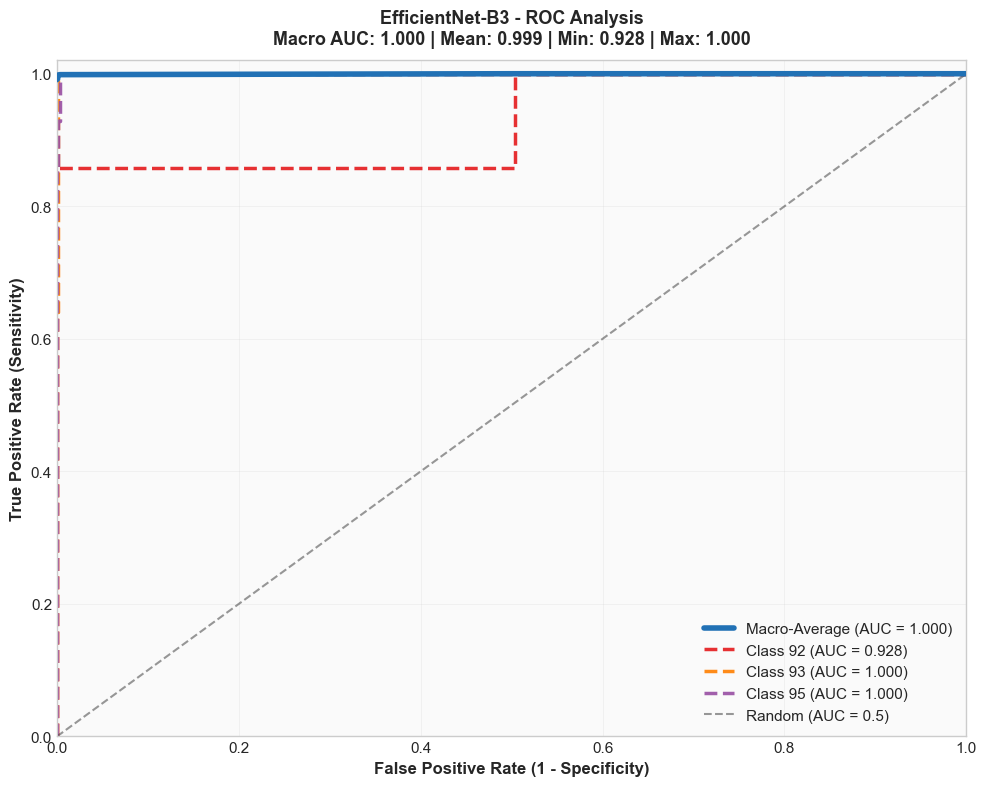

In [36]:
# Reload module and generate clean ROC curves
import sys
if 'src.evaluation.visualization' in sys.modules:
    del sys.modules['src.evaluation.visualization']
from src.evaluation.visualization import plot_roc_curves

# Plot ROC curves (clean version: macro-average + 3 worst classes only)
if baseline_results is not None:
    print("\nGenerating ROC curves for Baseline CNN...")
    plot_roc_curves(
        baseline_results['true_labels'],
        baseline_results['probabilities'],
        top_k=3,
        title='Baseline CNN',
        save_path=FIGURES_DIR / 'baseline_cnn_roc_curves.png'
    )

if resnet50_results is not None:
    print("\nGenerating ROC curves for ResNet50...")
    plot_roc_curves(
        resnet50_results['true_labels'],
        resnet50_results['probabilities'],
        top_k=3,
        title='ResNet50',
        save_path=FIGURES_DIR / 'resnet50_roc_curves.png'
    )

if efficientnet_results is not None:
    print("\nGenerating ROC curves for EfficientNet-B3...")
    plot_roc_curves(
        efficientnet_results['true_labels'],
        efficientnet_results['probabilities'],
        top_k=3,
        title='EfficientNet-B3',
        save_path=FIGURES_DIR / 'efficientnet_b3_roc_curves.png'
    )


Generating per-class performance for Baseline CNN...
Per-class performance saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\baseline_cnn_per_class_f1.png


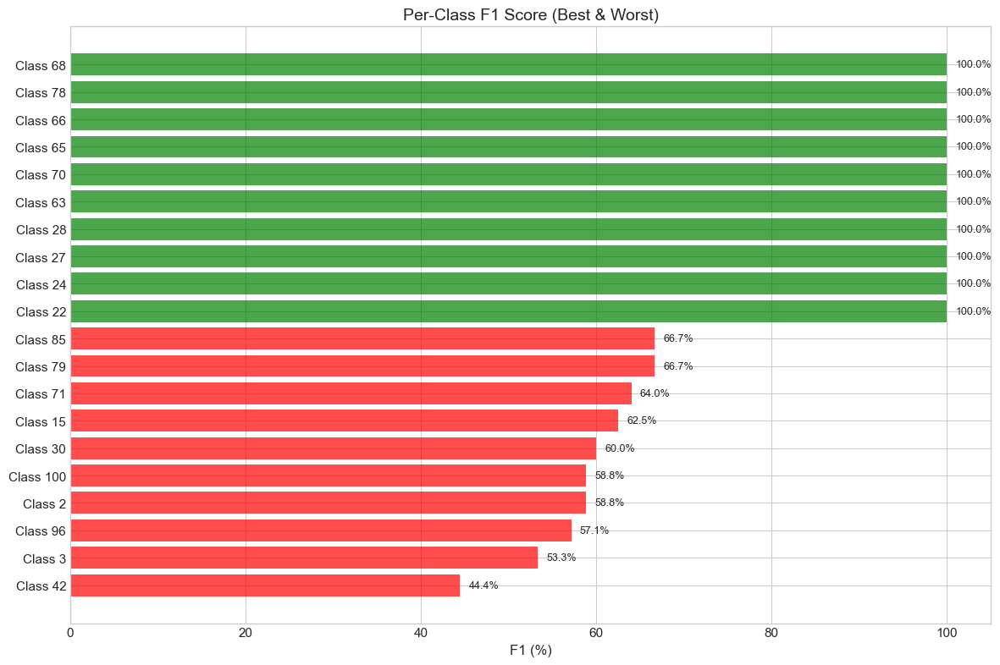


Generating per-class performance for ResNet50...
Per-class performance saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\resnet50_per_class_f1.png


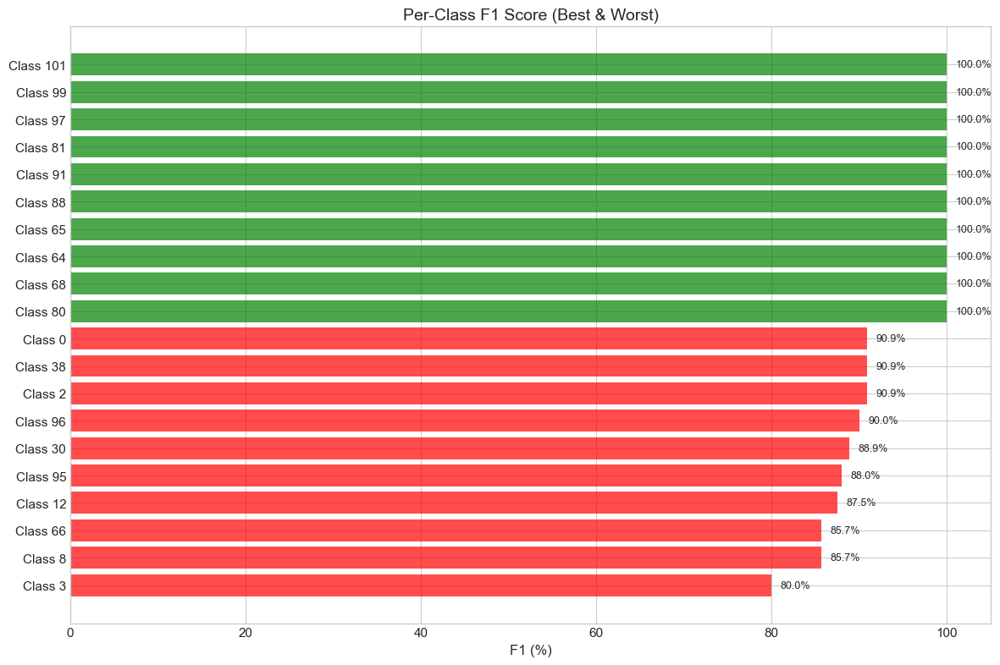


Generating per-class performance for EfficientNet-B3...
Per-class performance saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\efficientnet_b3_per_class_f1.png


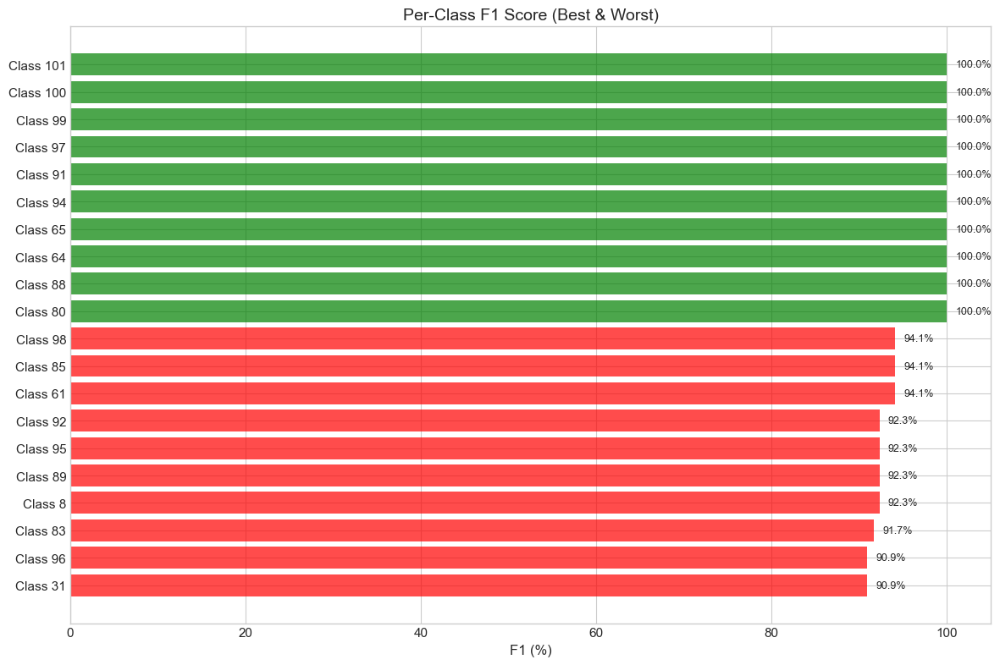

In [33]:
# Plot per-class F1 scores for each model
if baseline_metrics is not None:
    print("\nGenerating per-class performance for Baseline CNN...")
    plot_per_class_performance(
        baseline_metrics,
        metric='f1',
        top_k=20,
        save_path=FIGURES_DIR / 'baseline_cnn_per_class_f1.png'
    )

if resnet50_metrics is not None:
    print("\nGenerating per-class performance for ResNet50...")
    plot_per_class_performance(
        resnet50_metrics,
        metric='f1',
        top_k=20,
        save_path=FIGURES_DIR / 'resnet50_per_class_f1.png'
    )

if efficientnet_metrics is not None:
    print("\nGenerating per-class performance for EfficientNet-B3...")
    plot_per_class_performance(
        efficientnet_metrics,
        metric='f1',
        top_k=20,
        save_path=FIGURES_DIR / 'efficientnet_b3_per_class_f1.png'
    )

## 8.1 Additional Evaluation Metrics

Calculate advanced metrics including Cohen's Kappa, Precision-Recall curves, and model complexity metrics.

In [34]:
# Calculate additional metrics for all models
print("=" * 80)
print("ADDITIONAL EVALUATION METRICS")
print("=" * 80)

additional_metrics = {}

# Baseline CNN
if baseline_results is not None and baseline_metrics is not None:
    print("\nCalculating additional metrics for Baseline CNN...")
    baseline_additional = {}
    
    # Cohen's Kappa
    baseline_additional['cohen_kappa'] = cohen_kappa_score(
        baseline_results['true_labels'], 
        baseline_results['predictions']
    )
    
    # Average Precision (Macro)
    y_bin = label_binarize(baseline_results['true_labels'], classes=range(NUM_CLASSES))
    baseline_additional['average_precision_macro'] = average_precision_score(
        y_bin, baseline_results['probabilities'], average='macro'
    )
    
    # Model size
    baseline_model_size = sum(p.numel() * 4 for p in baseline_model.parameters()) / (1024 * 1024)  # MB
    baseline_additional['model_size_mb'] = baseline_model_size
    
    # FLOPs (if available)
    if THOP_AVAILABLE:
        try:
            dummy_input = torch.randn(1, 3, 224, 224).to(device)
            flops, params = profile(baseline_model, inputs=(dummy_input,), verbose=False)
            baseline_additional['flops'] = flops
            baseline_additional['flops_g'] = flops / 1e9
        except:
            baseline_additional['flops'] = None
            baseline_additional['flops_g'] = None
    else:
        baseline_additional['flops'] = None
        baseline_additional['flops_g'] = None
    
    additional_metrics['baseline'] = baseline_additional
    print(f"  Cohen's Kappa: {baseline_additional['cohen_kappa']:.4f}")
    print(f"  Average Precision (Macro): {baseline_additional['average_precision_macro']:.4f}")
    print(f"  Model Size: {baseline_additional['model_size_mb']:.2f} MB")

# ResNet50
if resnet50_results is not None and resnet50_metrics is not None:
    print("\nCalculating additional metrics for ResNet50...")
    resnet50_additional = {}
    
    # Cohen's Kappa
    resnet50_additional['cohen_kappa'] = cohen_kappa_score(
        resnet50_results['true_labels'], 
        resnet50_results['predictions']
    )
    
    # Average Precision (Macro)
    y_bin = label_binarize(resnet50_results['true_labels'], classes=range(NUM_CLASSES))
    resnet50_additional['average_precision_macro'] = average_precision_score(
        y_bin, resnet50_results['probabilities'], average='macro'
    )
    
    # Model size
    resnet50_model_size = sum(p.numel() * 4 for p in resnet50_model.parameters()) / (1024 * 1024)  # MB
    resnet50_additional['model_size_mb'] = resnet50_model_size
    
    # FLOPs (if available)
    if THOP_AVAILABLE:
        try:
            dummy_input = torch.randn(1, 3, 224, 224).to(device)
            flops, params = profile(resnet50_model, inputs=(dummy_input,), verbose=False)
            resnet50_additional['flops'] = flops
            resnet50_additional['flops_g'] = flops / 1e9
        except:
            resnet50_additional['flops'] = None
            resnet50_additional['flops_g'] = None
    else:
        resnet50_additional['flops'] = None
        resnet50_additional['flops_g'] = None
    
    additional_metrics['resnet50'] = resnet50_additional
    print(f"  Cohen's Kappa: {resnet50_additional['cohen_kappa']:.4f}")
    print(f"  Average Precision (Macro): {resnet50_additional['average_precision_macro']:.4f}")
    print(f"  Model Size: {resnet50_additional['model_size_mb']:.2f} MB")

# EfficientNet-B3
if efficientnet_results is not None and efficientnet_metrics is not None:
    print("\nCalculating additional metrics for EfficientNet-B3...")
    efficientnet_additional = {}
    
    # Cohen's Kappa
    efficientnet_additional['cohen_kappa'] = cohen_kappa_score(
        efficientnet_results['true_labels'], 
        efficientnet_results['predictions']
    )
    
    # Average Precision (Macro)
    y_bin = label_binarize(efficientnet_results['true_labels'], classes=range(NUM_CLASSES))
    efficientnet_additional['average_precision_macro'] = average_precision_score(
        y_bin, efficientnet_results['probabilities'], average='macro'
    )
    
    # Model size
    efficientnet_model_size = sum(p.numel() * 4 for p in efficientnet_model.parameters()) / (1024 * 1024)  # MB
    efficientnet_additional['model_size_mb'] = efficientnet_model_size
    
    # FLOPs (if available)
    if THOP_AVAILABLE:
        try:
            dummy_input = torch.randn(1, 3, 300, 300).to(device)
            flops, params = profile(efficientnet_model, inputs=(dummy_input,), verbose=False)
            efficientnet_additional['flops'] = flops
            efficientnet_additional['flops_g'] = flops / 1e9
        except:
            efficientnet_additional['flops'] = None
            efficientnet_additional['flops_g'] = None
    else:
        efficientnet_additional['flops'] = None
        efficientnet_additional['flops_g'] = None
    
    additional_metrics['efficientnet'] = efficientnet_additional
    print(f"  Cohen's Kappa: {efficientnet_additional['cohen_kappa']:.4f}")
    print(f"  Average Precision (Macro): {efficientnet_additional['average_precision_macro']:.4f}")
    print(f"  Model Size: {efficientnet_additional['model_size_mb']:.2f} MB")

print("\n" + "=" * 80)

ADDITIONAL EVALUATION METRICS

Calculating additional metrics for Baseline CNN...
  Cohen's Kappa: 0.8624
  Average Precision (Macro): 0.9446
  Model Size: 45.43 MB

Calculating additional metrics for ResNet50...
  Cohen's Kappa: 0.9794
  Average Precision (Macro): 0.9945
  Model Size: 93.88 MB

Calculating additional metrics for EfficientNet-B3...
  Cohen's Kappa: 0.9893
  Average Precision (Macro): 0.9980
  Model Size: 42.40 MB



## 8.3 Feature Embeddings Visualization (t-SNE)

Visualize high-dimensional feature embeddings using t-SNE to understand class separation in feature space.


FEATURE EMBEDDINGS VISUALIZATION (t-SNE)

Generating t-SNE for Baseline CNN...
Extracting features for Baseline CNN...
  Extracted 1000 feature vectors of dimension 768
  Applying t-SNE (this may take a few minutes)...
✓ t-SNE visualization saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\baseline_cnn_tsne.png


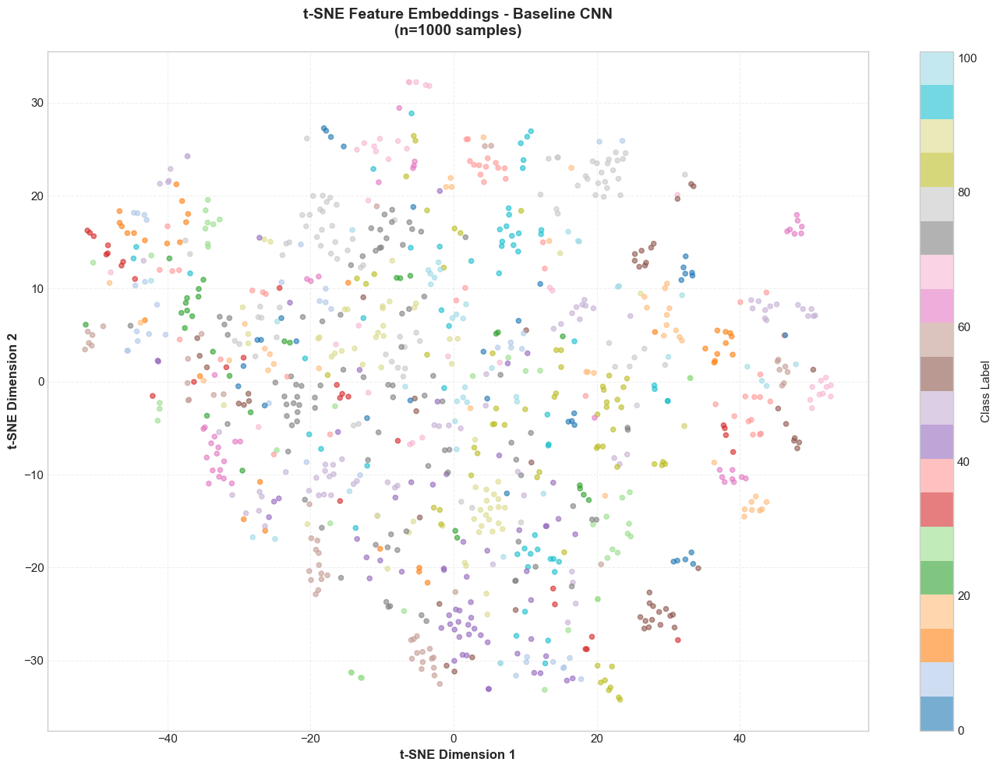


Generating t-SNE for ResNet50...
Extracting features for ResNet50...
  Extracted 1000 feature vectors of dimension 2048
  Applying t-SNE (this may take a few minutes)...
✓ t-SNE visualization saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\resnet50_tsne.png


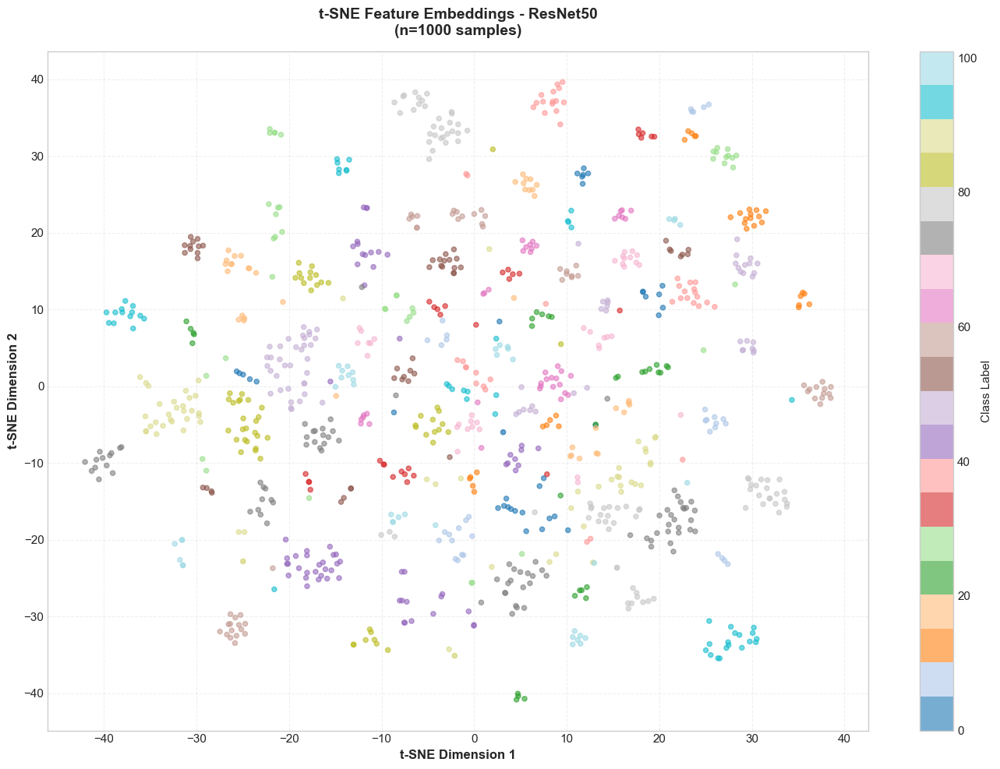


Generating t-SNE for EfficientNet-B3...
Extracting features for EfficientNet-B3...
  Extracted 1000 feature vectors of dimension 1536
  Applying t-SNE (this may take a few minutes)...
✓ t-SNE visualization saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\efficientnet_b3_tsne.png


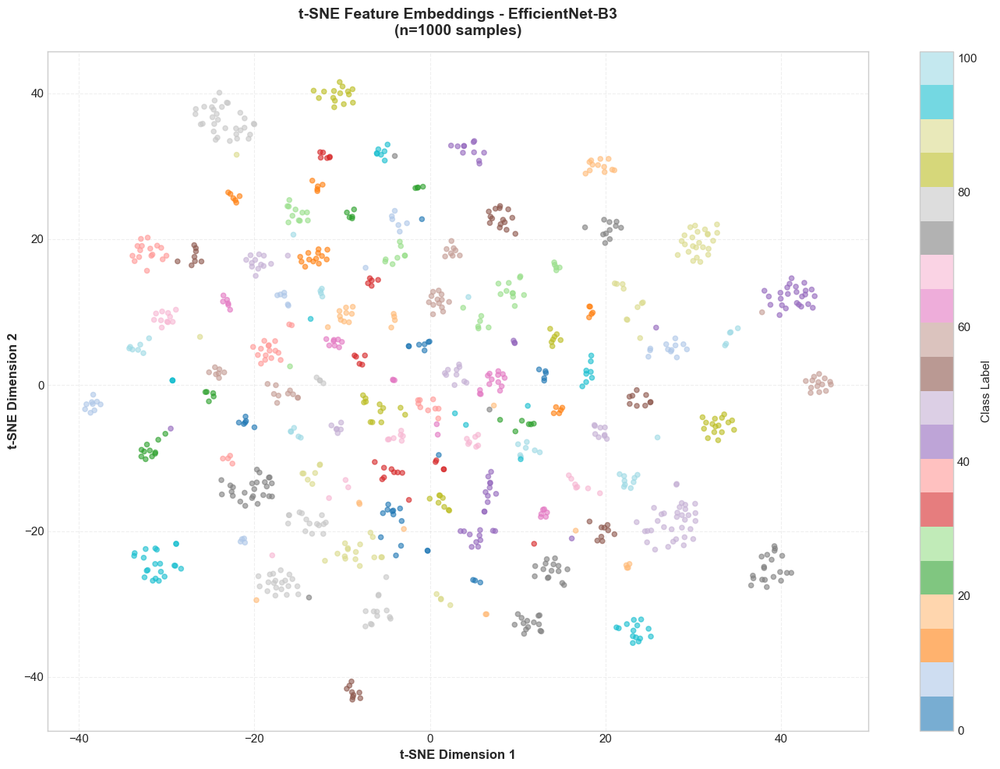

In [37]:
# Extract features and visualize with t-SNE
def extract_features_and_visualize_tsne(model, data_loader, model_name, device='cuda', 
                                         n_samples=1000, save_path=None):
    """Extract features and create t-SNE visualization."""
    model.eval()
    model.to(device)
    
    features_list = []
    labels_list = []
    
    print(f"Extracting features for {model_name}...")
    with torch.no_grad():
        for i, (images, labels) in enumerate(data_loader):
            if i * data_loader.batch_size >= n_samples:
                break
            
            images = images.to(device)
            
            # Extract features before classification head
            if hasattr(model, 'get_features'):
                features = model.get_features(images)
            elif hasattr(model, 'backbone'):
                # For transfer learning models
                features = model.backbone(images)
                if hasattr(features, 'view'):
                    features = features.view(features.size(0), -1)
            else:
                # Fallback: use intermediate layer
                x = model.features(images) if hasattr(model, 'features') else images
                if hasattr(model, 'global_pool'):
                    x = model.global_pool(x)
                    features = x.view(x.size(0), -1)
                else:
                    features = x.view(x.size(0), -1)
            
            features_list.append(features.cpu().numpy())
            labels_list.append(labels.numpy())
    
    # Concatenate all features
    all_features = np.concatenate(features_list, axis=0)
    all_labels = np.concatenate(labels_list, axis=0)
    
    # Limit to n_samples
    if len(all_features) > n_samples:
        indices = np.random.choice(len(all_features), n_samples, replace=False)
        all_features = all_features[indices]
        all_labels = all_labels[indices]
    
    print(f"  Extracted {len(all_features)} feature vectors of dimension {all_features.shape[1]}")
    print(f"  Applying t-SNE (this may take a few minutes)...")
    
    # Apply t-SNE
    tsne = TSNE(n_components=2, random_state=42, perplexity=30, max_iter=1000)
    features_2d = tsne.fit_transform(all_features)
    
    # Visualize
    plt.figure(figsize=(14, 10))
    
    # Use a colormap for 102 classes
    scatter = plt.scatter(features_2d[:, 0], features_2d[:, 1], 
                         c=all_labels, cmap='tab20', alpha=0.6, s=20)
    plt.colorbar(scatter, label='Class Label')
    plt.xlabel('t-SNE Dimension 1', fontsize=12, fontweight='bold')
    plt.ylabel('t-SNE Dimension 2', fontsize=12, fontweight='bold')
    plt.title(f't-SNE Feature Embeddings - {model_name}\n(n={len(all_features)} samples)', 
             fontsize=14, fontweight='bold', pad=15)
    plt.grid(True, alpha=0.3, linestyle='--')
    
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
        print(f"✓ t-SNE visualization saved to {save_path}")
    plt.show()
    
    return features_2d, all_labels

# Generate t-SNE visualizations (using subset for efficiency)
print("\n" + "=" * 80)
print("FEATURE EMBEDDINGS VISUALIZATION (t-SNE)")
print("=" * 80)

if baseline_model is not None and test_loader_224 is not None:
    print("\nGenerating t-SNE for Baseline CNN...")
    try:
        baseline_tsne, baseline_tsne_labels = extract_features_and_visualize_tsne(
            baseline_model, test_loader_224, 'Baseline CNN',
            device=device, n_samples=1000,
            save_path=FIGURES_DIR / 'baseline_cnn_tsne.png'
        )
    except Exception as e:
        print(f"⚠ Error generating t-SNE for Baseline CNN: {e}")

if resnet50_model is not None and test_loader_224 is not None:
    print("\nGenerating t-SNE for ResNet50...")
    try:
        resnet50_tsne, resnet50_tsne_labels = extract_features_and_visualize_tsne(
            resnet50_model, test_loader_224, 'ResNet50',
            device=device, n_samples=1000,
            save_path=FIGURES_DIR / 'resnet50_tsne.png'
        )
    except Exception as e:
        print(f"⚠ Error generating t-SNE for ResNet50: {e}")

if efficientnet_model is not None and test_loader_300 is not None:
    print("\nGenerating t-SNE for EfficientNet-B3...")
    try:
        efficientnet_tsne, efficientnet_tsne_labels = extract_features_and_visualize_tsne(
            efficientnet_model, test_loader_300, 'EfficientNet-B3',
            device=device, n_samples=1000,
            save_path=FIGURES_DIR / 'efficientnet_b3_tsne.png'
        )
    except Exception as e:
        print(f"⚠ Error generating t-SNE for EfficientNet-B3: {e}")

## 8.4 Grad-CAM Visualizations

Generate Grad-CAM (Gradient-weighted Class Activation Mapping) visualizations to understand what regions of the image the models focus on.


GRAD-CAM VISUALIZATIONS
Generating Grad-CAM visualizations for Baseline CNN...
  Target layer: ConvBlock(
  (conv): Conv2d(384, 768, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn): BatchNorm2d(768, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (pool): Identity()
)
Grad-CAM visualization saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\baseline_cnn_gradcam_sample_1.png


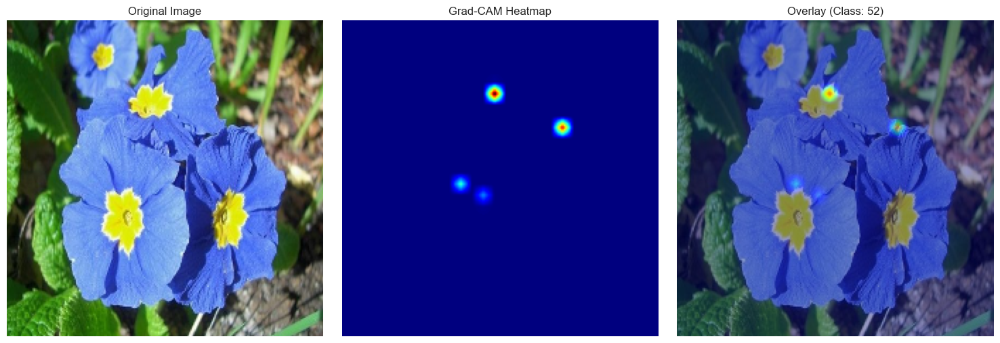

  Sample 1: True=52, Pred=52 (conf=0.852)
Grad-CAM visualization saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\baseline_cnn_gradcam_sample_2.png


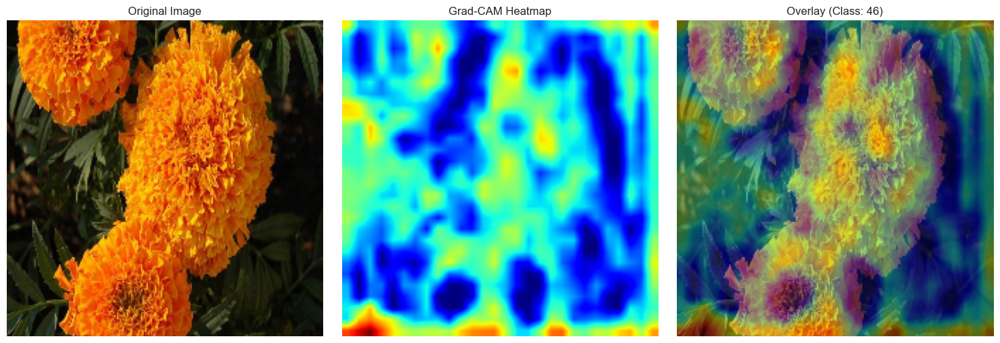

  Sample 2: True=46, Pred=46 (conf=0.998)
Grad-CAM visualization saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\baseline_cnn_gradcam_sample_3.png


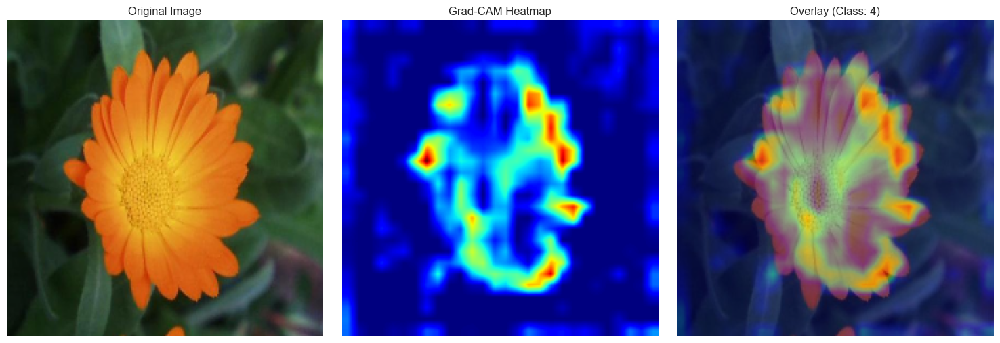

  Sample 3: True=4, Pred=4 (conf=0.983)
Grad-CAM visualization saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\baseline_cnn_gradcam_sample_4.png


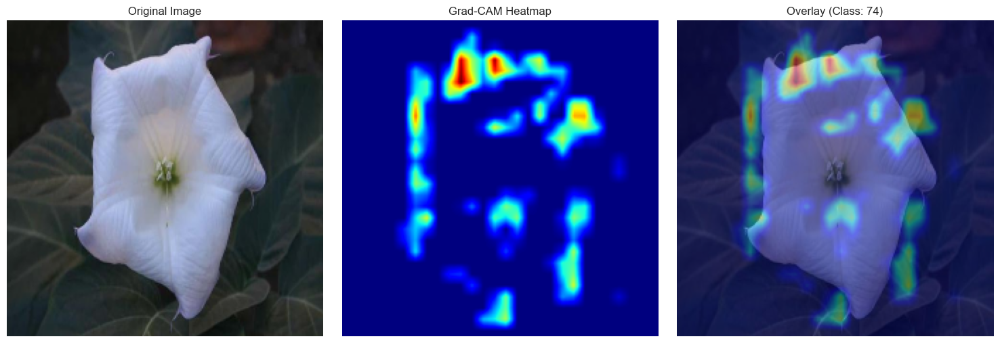

  Sample 4: True=74, Pred=74 (conf=0.999)
Grad-CAM visualization saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\baseline_cnn_gradcam_sample_5.png


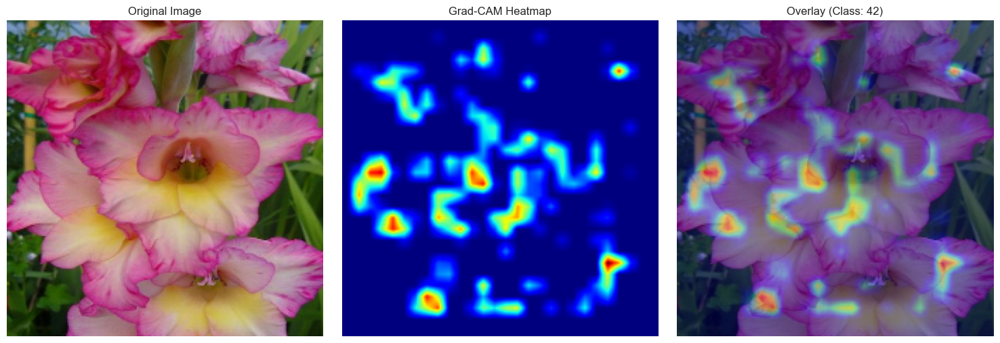

  Sample 5: True=42, Pred=42 (conf=0.729)
Generating Grad-CAM visualizations for ResNet50...
  Target layer: Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
Grad-CAM visualization saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\resnet50_gradcam_sample_1.png


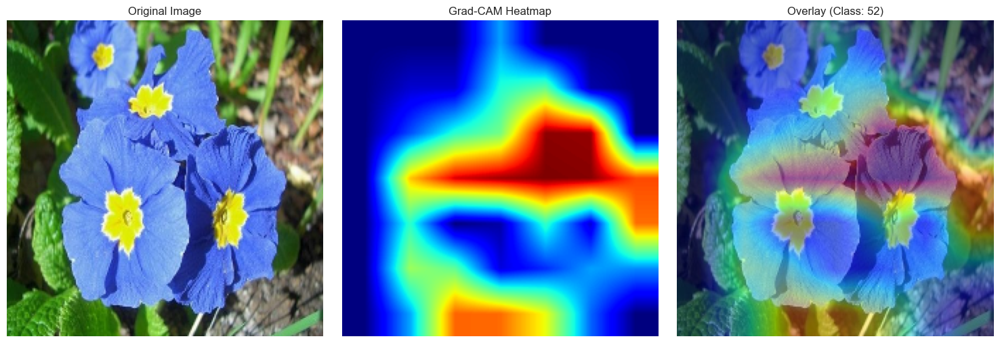

  Sample 1: True=52, Pred=52 (conf=1.000)
Grad-CAM visualization saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\resnet50_gradcam_sample_2.png


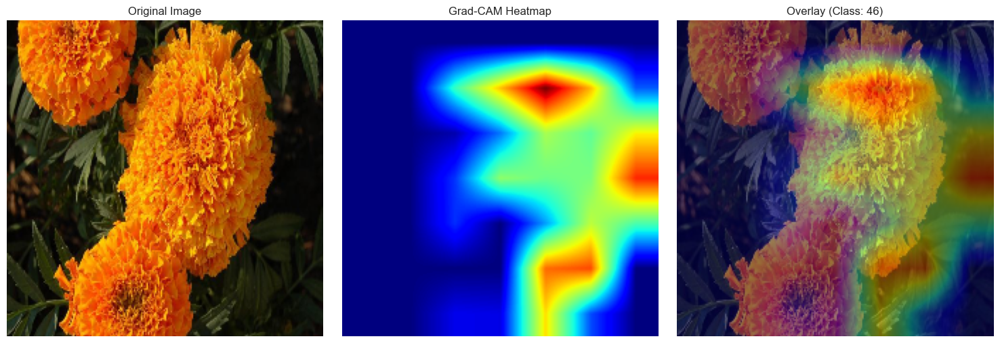

  Sample 2: True=46, Pred=46 (conf=1.000)
Grad-CAM visualization saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\resnet50_gradcam_sample_3.png


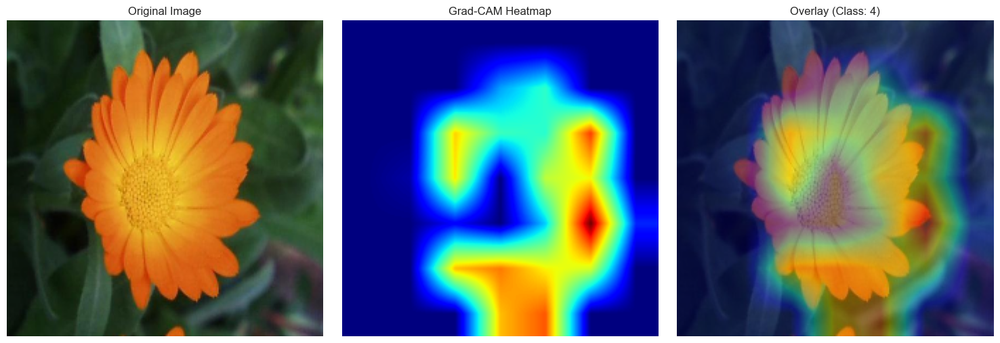

  Sample 3: True=4, Pred=4 (conf=1.000)
Grad-CAM visualization saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\resnet50_gradcam_sample_4.png


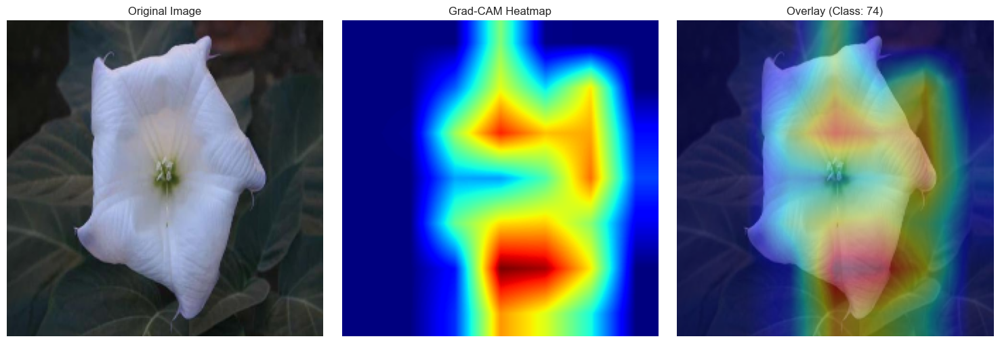

  Sample 4: True=74, Pred=74 (conf=1.000)
Grad-CAM visualization saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\figures\resnet50_gradcam_sample_5.png


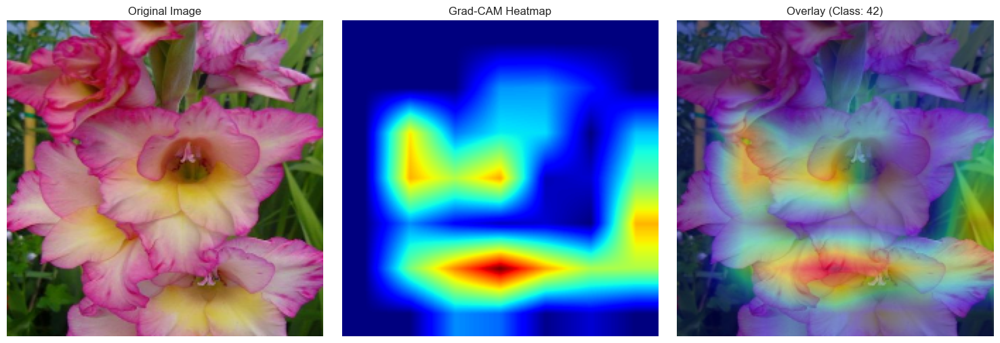

  Sample 5: True=42, Pred=42 (conf=1.000)
Generating Grad-CAM visualizations for EfficientNet-B3...
  Target layer: Sequential(
  (0): InvertedResidual(
    (conv_pw): Conv2d(232, 1392, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNormAct2d(
      1392, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True
      (drop): Identity()
      (act): SiLU(inplace=True)
    )
    (conv_dw): Conv2d(1392, 1392, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=1392, bias=False)
    (bn2): BatchNormAct2d(
      1392, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True
      (drop): Identity()
      (act): SiLU(inplace=True)
    )
    (aa): Identity()
    (se): SqueezeExcite(
      (conv_reduce): Conv2d(1392, 58, kernel_size=(1, 1), stride=(1, 1))
      (act1): SiLU(inplace=True)
      (conv_expand): Conv2d(58, 1392, kernel_size=(1, 1), stride=(1, 1))
      (gate): Sigmoid()
    )
    (conv_pwl): Conv2d(1392, 384, kernel_size=(1, 1), stride=(1, 1), bia

In [ ]:
# Generate Grad-CAM visualizations for sample images
def generate_gradcam_for_samples(model, data_loader, model_name, device='cuda', 
                                 n_samples=5, save_dir=None):
    """Generate Grad-CAM visualizations for sample images."""
    from src.evaluation.visualization import visualize_gradcam
    
    model.eval()
    model.to(device)
    
    # Get target layer for Grad-CAM
    target_layer = None
    
    if hasattr(model, 'features'):
        # Baseline CNN - use last conv layer
        if hasattr(model.features, '__getitem__'):
            target_layer = model.features[-2]  # Second to last layer
    elif hasattr(model, 'backbone'):
        # Transfer learning models
        if hasattr(model.backbone, 'layer4'):
            # ResNet50
            target_layer = model.backbone.layer4[-1].conv3
        elif hasattr(model.backbone, 'blocks'):
            # EfficientNet
            target_layer = model.backbone.blocks[-1]
    
    if target_layer is None:
        print(f"⚠ Could not find target layer for {model_name}. Skipping Grad-CAM.")
        return
    
    print(f"Generating Grad-CAM visualizations for {model_name}...")
    print(f"  Target layer: {target_layer}")
    
    samples_generated = 0
    for images, labels in data_loader:
        if samples_generated >= n_samples:
            break
        
        for i in range(min(images.size(0), n_samples - samples_generated)):
            image_tensor = images[i:i+1].to(device)
            true_label = labels[i].item()
            
            # Get prediction
            with torch.no_grad():
                output = model(image_tensor)
                pred_label = output.argmax(dim=1).item()
                confidence = torch.softmax(output, dim=1)[0, pred_label].item()
            
            # Generate Grad-CAM
            try:
                save_path = save_dir / f'{model_name.lower().replace(" ", "_")}_gradcam_sample_{samples_generated+1}.png' if save_dir else None
                
                visualize_gradcam(
                    model=model,
                    image_tensor=image_tensor,
                    target_layer=target_layer,
                    class_idx=pred_label,
                    device=device,
                    save_path=save_path
                )
                
                print(f"  Sample {samples_generated+1}: True={true_label}, Pred={pred_label} (conf={confidence:.3f})")
                samples_generated += 1
            except Exception as e:
                print(f"  ⚠ Error generating Grad-CAM for sample {samples_generated+1}: {e}")
                continue

# Generate Grad-CAM visualizations
print("\n" + "=" * 80)
print("GRAD-CAM VISUALIZATIONS")
print("=" * 80)

if baseline_model is not None and test_loader_224 is not None:
    try:
        generate_gradcam_for_samples(
            baseline_model, test_loader_224, 'Baseline CNN',
            device=device, n_samples=5,
            save_dir=FIGURES_DIR
        )
    except Exception as e:
        print(f"⚠ Error generating Grad-CAM for Baseline CNN: {e}")

if resnet50_model is not None and test_loader_224 is not None:
    try:
        generate_gradcam_for_samples(
            resnet50_model, test_loader_224, 'ResNet50',
            device=device, n_samples=5,
            save_dir=FIGURES_DIR
        )
    except Exception as e:
        print(f"⚠ Error generating Grad-CAM for ResNet50: {e}")

if efficientnet_model is not None and test_loader_300 is not None:
    try:
        generate_gradcam_for_samples(
            efficientnet_model, test_loader_300, 'EfficientNet-B3',
            device=device, n_samples=5,
            save_dir=FIGURES_DIR
        )
    except Exception as e:
        print(f"⚠ Error generating Grad-CAM for EfficientNet-B3: {e}")

## 8.5 Comprehensive Metrics Comparison Table

Create a comprehensive comparison table including all evaluation metrics.

In [ ]:
# Create comprehensive metrics comparison table
print("\n" + "=" * 100)
print("COMPREHENSIVE METRICS COMPARISON TABLE")
print("=" * 100)

comprehensive_data = []

if baseline_metrics is not None:
    row = {
        'Model': 'Baseline CNN',
        'Accuracy (%)': baseline_metrics['accuracy'],
        'Top-5 Accuracy (%)': baseline_metrics.get('top_5_accuracy', 0),
        'Precision (Macro) (%)': baseline_metrics['precision_macro'],
        'Recall (Macro) (%)': baseline_metrics['recall_macro'],
        'F1-Score (Macro) (%)': baseline_metrics['f1_macro'],
        'ROC-AUC (Macro)': baseline_metrics.get('roc_auc_macro', 0),
        'Cohen\'s Kappa': additional_metrics.get('baseline', {}).get('cohen_kappa', 0),
        'Avg Precision (Macro)': additional_metrics.get('baseline', {}).get('average_precision_macro', 0),
        'Parameters': baseline_params if 'baseline_params' in locals() else 0,
        'Model Size (MB)': additional_metrics.get('baseline', {}).get('model_size_mb', 0),
        'FLOPs (G)': additional_metrics.get('baseline', {}).get('flops_g', 0) if additional_metrics.get('baseline', {}).get('flops_g') else 'N/A',
        'Inference Time (ms)': baseline_inference_time if 'baseline_inference_time' in locals() else 0,
        'Image Size': '224×224'
    }
    comprehensive_data.append(row)

if resnet50_metrics is not None:
    row = {
        'Model': 'ResNet50',
        'Accuracy (%)': resnet50_metrics['accuracy'],
        'Top-5 Accuracy (%)': resnet50_metrics.get('top_5_accuracy', 0),
        'Precision (Macro) (%)': resnet50_metrics['precision_macro'],
        'Recall (Macro) (%)': resnet50_metrics['recall_macro'],
        'F1-Score (Macro) (%)': resnet50_metrics['f1_macro'],
        'ROC-AUC (Macro)': resnet50_metrics.get('roc_auc_macro', 0),
        'Cohen\'s Kappa': additional_metrics.get('resnet50', {}).get('cohen_kappa', 0),
        'Avg Precision (Macro)': additional_metrics.get('resnet50', {}).get('average_precision_macro', 0),
        'Parameters': resnet50_params if 'resnet50_params' in locals() else 0,
        'Model Size (MB)': additional_metrics.get('resnet50', {}).get('model_size_mb', 0),
        'FLOPs (G)': additional_metrics.get('resnet50', {}).get('flops_g', 0) if additional_metrics.get('resnet50', {}).get('flops_g') else 'N/A',
        'Inference Time (ms)': resnet50_inference_time if 'resnet50_inference_time' in locals() else 0,
        'Image Size': '224×224'
    }
    comprehensive_data.append(row)

if efficientnet_metrics is not None:
    row = {
        'Model': 'EfficientNet-B3',
        'Accuracy (%)': efficientnet_metrics['accuracy'],
        'Top-5 Accuracy (%)': efficientnet_metrics.get('top_5_accuracy', 0),
        'Precision (Macro) (%)': efficientnet_metrics['precision_macro'],
        'Recall (Macro) (%)': efficientnet_metrics['recall_macro'],
        'F1-Score (Macro) (%)': efficientnet_metrics['f1_macro'],
        'ROC-AUC (Macro)': efficientnet_metrics.get('roc_auc_macro', 0),
        'Cohen\'s Kappa': additional_metrics.get('efficientnet', {}).get('cohen_kappa', 0),
        'Avg Precision (Macro)': additional_metrics.get('efficientnet', {}).get('average_precision_macro', 0),
        'Parameters': efficientnet_params if 'efficientnet_params' in locals() else 0,
        'Model Size (MB)': additional_metrics.get('efficientnet', {}).get('model_size_mb', 0),
        'FLOPs (G)': additional_metrics.get('efficientnet', {}).get('flops_g', 0) if additional_metrics.get('efficientnet', {}).get('flops_g') else 'N/A',
        'Inference Time (ms)': efficientnet_inference_time if 'efficientnet_inference_time' in locals() else 0,
        'Image Size': '300×300'
    }
    comprehensive_data.append(row)

if comprehensive_data:
    comprehensive_df = pd.DataFrame(comprehensive_data)
    
    # Format for display
    display_df = comprehensive_df.copy()
    for col in ['Accuracy (%)', 'Top-5 Accuracy (%)', 'Precision (Macro) (%)', 
                'Recall (Macro) (%)', 'F1-Score (Macro) (%)']:
        if col in display_df.columns:
            display_df[col] = display_df[col].apply(lambda x: f"{x:.2f}%")
    
    for col in ['ROC-AUC (Macro)', 'Cohen\'s Kappa', 'Avg Precision (Macro)']:
        if col in display_df.columns:
            display_df[col] = display_df[col].apply(lambda x: f"{x:.4f}" if isinstance(x, (int, float)) else str(x))
    
    if 'Parameters' in display_df.columns:
        display_df['Parameters'] = display_df['Parameters'].apply(lambda x: f"{x/1e6:.1f}M" if isinstance(x, (int, float)) else str(x))
    
    if 'Model Size (MB)' in display_df.columns:
        display_df['Model Size (MB)'] = display_df['Model Size (MB)'].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else str(x))
    
    if 'Inference Time (ms)' in display_df.columns:
        display_df['Inference Time (ms)'] = display_df['Inference Time (ms)'].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else str(x))
    
    print("\n" + display_df.to_string(index=False))
    
    # Save to CSV
    comprehensive_df.to_csv(OUTPUT_DIR / 'comprehensive_metrics_comparison.csv', index=False)
    print(f"\n✓ Comprehensive metrics saved to {OUTPUT_DIR / 'comprehensive_metrics_comparison.csv'}")
    
    # Create visualization
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    
    models = comprehensive_df['Model'].values
    colors = ['#FF6B6B', '#4ECDC4', '#45B7D1']
    
    # Cohen's Kappa
    axes[0, 0].bar(models, comprehensive_df['Cohen\'s Kappa'], color=colors, alpha=0.8, edgecolor='black', linewidth=1.5)
    axes[0, 0].set_ylabel('Cohen\'s Kappa', fontsize=12, fontweight='bold')
    axes[0, 0].set_title('Cohen\'s Kappa Comparison', fontsize=14, fontweight='bold', pad=15)
    axes[0, 0].grid(True, alpha=0.3, axis='y', linestyle='--')
    axes[0, 0].set_ylim([0, 1.05])
    for i, (bar, v) in enumerate(zip(axes[0, 0].patches, comprehensive_df['Cohen\'s Kappa'])):
        axes[0, 0].text(bar.get_x() + bar.get_width()/2, v + 0.02, 
                       f'{v:.4f}', ha='center', fontweight='bold', fontsize=11)
    
    # Average Precision
    axes[0, 1].bar(models, comprehensive_df['Avg Precision (Macro)'], color=colors, alpha=0.8, edgecolor='black', linewidth=1.5)
    axes[0, 1].set_ylabel('Average Precision (Macro)', fontsize=12, fontweight='bold')
    axes[0, 1].set_title('Average Precision Comparison', fontsize=14, fontweight='bold', pad=15)
    axes[0, 1].grid(True, alpha=0.3, axis='y', linestyle='--')
    axes[0, 1].set_ylim([0, 1.05])
    for i, (bar, v) in enumerate(zip(axes[0, 1].patches, comprehensive_df['Avg Precision (Macro)'])):
        axes[0, 1].text(bar.get_x() + bar.get_width()/2, v + 0.02, 
                       f'{v:.4f}', ha='center', fontweight='bold', fontsize=11)
    
    # Model Size
    axes[1, 0].bar(models, comprehensive_df['Model Size (MB)'], color=colors, alpha=0.8, edgecolor='black', linewidth=1.5)
    axes[1, 0].set_ylabel('Model Size (MB)', fontsize=12, fontweight='bold')
    axes[1, 0].set_title('Model Size Comparison', fontsize=14, fontweight='bold', pad=15)
    axes[1, 0].grid(True, alpha=0.3, axis='y', linestyle='--')
    for i, (bar, v) in enumerate(zip(axes[1, 0].patches, comprehensive_df['Model Size (MB)'])):
        axes[1, 0].text(bar.get_x() + bar.get_width()/2, v + max(comprehensive_df['Model Size (MB)']) * 0.02, 
                       f'{v:.1f}MB', ha='center', fontweight='bold', fontsize=11)
    
    # FLOPs (if available)
    flops_data = []
    flops_labels = []
    for i, model in enumerate(models):
        flops_val = comprehensive_df.iloc[i]['FLOPs (G)']
        if isinstance(flops_val, (int, float)) and not np.isnan(flops_val):
            flops_data.append(flops_val)
            flops_labels.append(model)
    
    if flops_data:
        axes[1, 1].bar(flops_labels, flops_data, color=[colors[i] for i, m in enumerate(models) if m in flops_labels], 
                      alpha=0.8, edgecolor='black', linewidth=1.5)
        axes[1, 1].set_ylabel('FLOPs (G)', fontsize=12, fontweight='bold')
        axes[1, 1].set_title('Computational Complexity (FLOPs)', fontsize=14, fontweight='bold', pad=15)
        axes[1, 1].grid(True, alpha=0.3, axis='y', linestyle='--')
        for i, (bar, v) in enumerate(zip(axes[1, 1].patches, flops_data)):
            axes[1, 1].text(bar.get_x() + bar.get_width()/2, v + max(flops_data) * 0.02, 
                           f'{v:.2f}G', ha='center', fontweight='bold', fontsize=11)
    else:
        axes[1, 1].text(0.5, 0.5, 'FLOPs data not available', 
                       ha='center', va='center', fontsize=12, transform=axes[1, 1].transAxes)
        axes[1, 1].set_title('Computational Complexity (FLOPs)', fontsize=14, fontweight='bold', pad=15)
    
    plt.suptitle('Additional Evaluation Metrics Comparison', fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout(rect=[0, 0, 1, 0.99])
    plt.savefig(FIGURES_DIR / 'additional_metrics_comparison.png', dpi=150, bbox_inches='tight')
    print(f"✓ Additional metrics visualization saved to {FIGURES_DIR / 'additional_metrics_comparison.png'}")
    plt.show()
    
    print("=" * 100)

In [ ]:
# Analyze errors and plot misclassified examples
# Note: We need to load images for visualization
if baseline_results is not None and test_loader_224 is not None:
    print("\nAnalyzing errors for Baseline CNN...")
    baseline_error_analysis = analyze_errors(
        baseline_results['predictions'],
        baseline_results['true_labels'],
        baseline_results['probabilities'],
        top_n=10
    )
    
    print(f"  Total errors: {baseline_error_analysis['total_errors']}")
    print(f"  Error rate: {baseline_error_analysis['error_rate']:.2f}%")
    print(f"\n  Top confusion pairs:")
    for (true_cls, pred_cls), count in baseline_error_analysis['top_confusion_pairs'][:5]:
        print(f"    Class {true_cls} -> Class {pred_cls}: {count} times")
    
    # Save error analysis
    with open(OUTPUT_DIR / 'baseline_cnn_error_analysis.txt', 'w') as f:
        f.write("Baseline CNN Error Analysis\n")
        f.write("=" * 60 + "\n\n")
        f.write(f"Total errors: {baseline_error_analysis['total_errors']}\n")
        f.write(f"Error rate: {baseline_error_analysis['error_rate']:.2f}%\n\n")
        f.write("Top confusion pairs:\n")
        for (true_cls, pred_cls), count in baseline_error_analysis['top_confusion_pairs']:
            f.write(f"  Class {true_cls} -> Class {pred_cls}: {count} times\n")
    print(f"  ✓ Error analysis saved to {OUTPUT_DIR / 'baseline_cnn_error_analysis.txt'}")

if resnet50_results is not None and test_loader_224 is not None:
    print("\nAnalyzing errors for ResNet50...")
    resnet50_error_analysis = analyze_errors(
        resnet50_results['predictions'],
        resnet50_results['true_labels'],
        resnet50_results['probabilities'],
        top_n=10
    )
    
    print(f"  Total errors: {resnet50_error_analysis['total_errors']}")
    print(f"  Error rate: {resnet50_error_analysis['error_rate']:.2f}%")
    print(f"\n  Top confusion pairs:")
    for (true_cls, pred_cls), count in resnet50_error_analysis['top_confusion_pairs'][:5]:
        print(f"    Class {true_cls} -> Class {pred_cls}: {count} times")
    
    # Save error analysis
    with open(OUTPUT_DIR / 'resnet50_error_analysis.txt', 'w') as f:
        f.write("ResNet50 Error Analysis\n")
        f.write("=" * 60 + "\n\n")
        f.write(f"Total errors: {resnet50_error_analysis['total_errors']}\n")
        f.write(f"Error rate: {resnet50_error_analysis['error_rate']:.2f}%\n\n")
        f.write("Top confusion pairs:\n")
        for (true_cls, pred_cls), count in resnet50_error_analysis['top_confusion_pairs']:
            f.write(f"  Class {true_cls} -> Class {pred_cls}: {count} times\n")
    print(f"  ✓ Error analysis saved to {OUTPUT_DIR / 'resnet50_error_analysis.txt'}")

if efficientnet_results is not None and test_loader_300 is not None:
    print("\nAnalyzing errors for EfficientNet-B3...")
    efficientnet_error_analysis = analyze_errors(
        efficientnet_results['predictions'],
        efficientnet_results['true_labels'],
        efficientnet_results['probabilities'],
        top_n=10
    )
    
    print(f"  Total errors: {efficientnet_error_analysis['total_errors']}")
    print(f"  Error rate: {efficientnet_error_analysis['error_rate']:.2f}%")
    print(f"\n  Top confusion pairs:")
    for (true_cls, pred_cls), count in efficientnet_error_analysis['top_confusion_pairs'][:5]:
        print(f"    Class {true_cls} -> Class {pred_cls}: {count} times")
    
    # Save error analysis
    with open(OUTPUT_DIR / 'efficientnet_b3_error_analysis.txt', 'w') as f:
        f.write("EfficientNet-B3 Error Analysis\n")
        f.write("=" * 60 + "\n\n")
        f.write(f"Total errors: {efficientnet_error_analysis['total_errors']}\n")
        f.write(f"Error rate: {efficientnet_error_analysis['error_rate']:.2f}%\n\n")
        f.write("Top confusion pairs:\n")
        for (true_cls, pred_cls), count in efficientnet_error_analysis['top_confusion_pairs']:
            f.write(f"  Class {true_cls} -> Class {pred_cls}: {count} times\n")
    print(f"  ✓ Error analysis saved to {OUTPUT_DIR / 'efficientnet_b3_error_analysis.txt'}")


Analyzing errors for Baseline CNN...
  Total errors: 167
  Error rate: 13.59%

  Top confusion pairs:
    Class 88 -> Class 82: 4 times
    Class 73 -> Class 30: 4 times
    Class 75 -> Class 97: 3 times
    Class 42 -> Class 97: 3 times
    Class 82 -> Class 85: 3 times
  ✓ Error analysis saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\evaluation\baseline_cnn_error_analysis.txt

Analyzing errors for ResNet50...
  Total errors: 25
  Error rate: 2.03%

  Top confusion pairs:
    Class 3 -> Class 8: 1 times
    Class 98 -> Class 89: 1 times
    Class 57 -> Class 45: 1 times
    Class 72 -> Class 12: 1 times
    Class 28 -> Class 30: 1 times
  ✓ Error analysis saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\evaluation\resnet50_error_analysis.txt

Analyzing errors for Effici

## 9. Summary & Conclusions

Save comprehensive evaluation summary and generate final comparison report.

In [ ]:
# Print final summary table
if comparison_data:
    print("\n" + "=" * 100)
    print("FINAL MODEL COMPARISON SUMMARY")
    print("=" * 100)
    print()
    
    # Create a formatted table
    summary_table = comparison_df.copy()
    
    # Format columns for better display
    summary_table['Parameters'] = summary_table['Parameters'].apply(lambda x: f"{x/1e6:.1f}M")
    summary_table['Inference Time (ms)'] = summary_table['Inference Time (ms)'].apply(lambda x: f"{x:.2f}")
    
    # Round percentage columns
    for col in ['Accuracy (%)', 'Top-5 Accuracy (%)', 'Precision (Macro) (%)', 
                'Recall (Macro) (%)', 'F1-Score (Macro) (%)']:
        if col in summary_table.columns:
            summary_table[col] = summary_table[col].apply(lambda x: f"{x:.2f}%")
    
    summary_table['ROC-AUC (Macro)'] = summary_table['ROC-AUC (Macro)'].apply(lambda x: f"{x:.4f}")
    
    # Display table
    print(summary_table.to_string(index=False))
    print()
    
    # Performance ranking
    print("=" * 100)
    print("PERFORMANCE RANKING (by Test Accuracy)")
    print("=" * 100)
    sorted_models = comparison_df.sort_values('Accuracy (%)', ascending=False)
    for idx, (_, row) in enumerate(sorted_models.iterrows(), 1):
        print(f"{idx}. {row['Model']:20s} - {row['Accuracy (%)']:6.2f}% accuracy")
    print()
    
    # Best model
    best_idx = comparison_df['Accuracy (%)'].idxmax()
    best_model = comparison_df.loc[best_idx, 'Model']
    best_acc = comparison_df.loc[best_idx, 'Accuracy (%)']
    print(f"🏆 Best Model: {best_model} ({best_acc:.2f}% accuracy)")
    print("=" * 100)


FINAL MODEL COMPARISON SUMMARY

          Model Accuracy (%) Top-5 Accuracy (%) Precision (Macro) (%) Recall (Macro) (%) F1-Score (Macro) (%) ROC-AUC (Macro) Parameters Inference Time (ms) Image Size
   Baseline CNN       86.41%             97.80%                86.99%             88.95%               86.88%          0.9971      11.9M               47.04    224×224
       ResNet50       97.97%             99.51%                97.62%             97.53%               97.43%          0.9994      24.6M               27.37    224×224
EfficientNet-B3       98.94%             99.76%                99.03%             98.82%               98.86%          0.9993      11.1M               31.53    300×300

PERFORMANCE RANKING (by Test Accuracy)
1. EfficientNet-B3      -  98.94% accuracy
2. ResNet50             -  97.97% accuracy
3. Baseline CNN         -  86.41% accuracy

🏆 Best Model: EfficientNet-B3 (98.94% accuracy)


In [ ]:
# Save comprehensive evaluation summary
summary_path = OUTPUT_DIR / 'evaluation_summary.txt'
with open(summary_path, 'w') as f:
    f.write("=" * 80 + "\n")
    f.write("MODEL EVALUATION SUMMARY\n")
    f.write("=" * 80 + "\n\n")
    f.write(f"Dataset: Oxford 102 Flower Dataset\n")
    f.write(f"Test Samples: {len(test_dataset_224) if test_dataset_224 else 'N/A'}\n")
    f.write(f"Number of Classes: {NUM_CLASSES}\n")
    f.write(f"Evaluation Date: {pd.Timestamp.now().strftime('%Y-%m-%d %H:%M:%S')}\n")
    f.write(f"\n" + "=" * 80 + "\n\n")
    
    # Baseline CNN
    if baseline_metrics is not None:
        f.write("BASELINE CNN (IMPROVED)\n")
        f.write("-" * 80 + "\n")
        f.write(f"Architecture: Custom CNN trained from scratch\n")
        f.write(f"Image Size: 224×224\n")
        f.write(f"Test Accuracy: {baseline_metrics['accuracy']:.2f}%\n")
        f.write(f"Top-5 Accuracy: {baseline_metrics.get('top_5_accuracy', 0):.2f}%\n")
        f.write(f"Precision (Macro): {baseline_metrics['precision_macro']:.2f}%\n")
        f.write(f"Recall (Macro): {baseline_metrics['recall_macro']:.2f}%\n")
        f.write(f"F1-Score (Macro): {baseline_metrics['f1_macro']:.2f}%\n")
        f.write(f"ROC-AUC (Macro): {baseline_metrics.get('roc_auc_macro', 0):.4f}\n")
        f.write(f"Parameters: {baseline_params if 'baseline_params' in locals() else 'N/A':,}\n")
        f.write(f"Inference Time: {baseline_inference_time if 'baseline_inference_time' in locals() else 'N/A':.2f} ms/image\n")
        f.write(f"Training Best Val Acc: {baseline_best_val_acc if 'baseline_best_val_acc' in locals() else 'N/A':.2f}%\n")
        f.write(f"\n")
    
    # ResNet50
    if resnet50_metrics is not None:
        f.write("RESNET50\n")
        f.write("-" * 80 + "\n")
        f.write(f"Architecture: ResNet50 with transfer learning\n")
        f.write(f"Image Size: 224×224\n")
        f.write(f"Test Accuracy: {resnet50_metrics['accuracy']:.2f}%\n")
        f.write(f"Top-5 Accuracy: {resnet50_metrics.get('top_5_accuracy', 0):.2f}%\n")
        f.write(f"Precision (Macro): {resnet50_metrics['precision_macro']:.2f}%\n")
        f.write(f"Recall (Macro): {resnet50_metrics['recall_macro']:.2f}%\n")
        f.write(f"F1-Score (Macro): {resnet50_metrics['f1_macro']:.2f}%\n")
        f.write(f"ROC-AUC (Macro): {resnet50_metrics.get('roc_auc_macro', 0):.4f}\n")
        f.write(f"Parameters: {resnet50_params if 'resnet50_params' in locals() else 'N/A':,}\n")
        f.write(f"Inference Time: {resnet50_inference_time if 'resnet50_inference_time' in locals() else 'N/A':.2f} ms/image\n")
        f.write(f"Training Best Val Acc: {resnet50_best_val_acc if 'resnet50_best_val_acc' in locals() else 'N/A':.2f}%\n")
        f.write(f"\n")
    
    # EfficientNet-B3
    if efficientnet_metrics is not None:
        f.write("EFFICIENTNET-B3\n")
        f.write("-" * 80 + "\n")
        f.write(f"Architecture: EfficientNet-B3 with transfer learning\n")
        f.write(f"Image Size: 300×300\n")
        f.write(f"Test Accuracy: {efficientnet_metrics['accuracy']:.2f}%\n")
        f.write(f"Top-5 Accuracy: {efficientnet_metrics.get('top_5_accuracy', 0):.2f}%\n")
        f.write(f"Precision (Macro): {efficientnet_metrics['precision_macro']:.2f}%\n")
        f.write(f"Recall (Macro): {efficientnet_metrics['recall_macro']:.2f}%\n")
        f.write(f"F1-Score (Macro): {efficientnet_metrics['f1_macro']:.2f}%\n")
        f.write(f"ROC-AUC (Macro): {efficientnet_metrics.get('roc_auc_macro', 0):.4f}\n")
        f.write(f"Parameters: {efficientnet_params if 'efficientnet_params' in locals() else 'N/A':,}\n")
        f.write(f"Inference Time: {efficientnet_inference_time if 'efficientnet_inference_time' in locals() else 'N/A':.2f} ms/image\n")
        f.write(f"Training Best Val Acc: {efficientnet_best_val_acc if 'efficientnet_best_val_acc' in locals() else 'N/A':.2f}%\n")
        f.write(f"\n")
    
    f.write("=" * 80 + "\n")
    f.write("MODEL COMPARISON\n")
    f.write("=" * 80 + "\n")
    
    if comparison_data:
        f.write("\nPerformance Ranking (by Test Accuracy):\n")
        sorted_models = comparison_df.sort_values('Accuracy (%)', ascending=False)
        for idx, (_, row) in enumerate(sorted_models.iterrows(), 1):
            f.write(f"{idx}. {row['Model']}: {row['Accuracy (%)']:.2f}%\n")
        
        best_model = comparison_df.loc[comparison_df['Accuracy (%)'].idxmax(), 'Model']
        best_accuracy = comparison_df['Accuracy (%)'].max()
        f.write(f"\nBest performing model: {best_model} ({best_accuracy:.2f}% accuracy)\n")
        
        f.write("\n" + "=" * 80 + "\n")
        f.write("KEY FINDINGS\n")
        f.write("=" * 80 + "\n")
        f.write("\n1. Transfer Learning Advantage:\n")
        f.write("   - ResNet50 and EfficientNet-B3 significantly outperform the baseline CNN\n")
        f.write("   - Pre-trained ImageNet weights provide strong feature representations\n")
        f.write("   - Transfer learning reduces training time and improves generalization\n")
        
        f.write("\n2. Model Efficiency:\n")
        if efficientnet_metrics is not None and resnet50_metrics is not None:
            eff_acc = efficientnet_metrics['accuracy']
            res_acc = resnet50_metrics['accuracy']
            eff_params = efficientnet_params if 'efficientnet_params' in locals() else 0
            res_params = resnet50_params if 'resnet50_params' in locals() else 0
            if eff_acc > res_acc and eff_params < res_params:
                f.write("   - EfficientNet-B3 achieves highest accuracy with fewer parameters\n")
                f.write(f"   - EfficientNet-B3: {eff_params/1e6:.1f}M params vs ResNet50: {res_params/1e6:.1f}M params\n")
                f.write("   - Demonstrates the effectiveness of compound scaling\n")
        
        f.write("\n3. Classification Performance:\n")
        f.write("   - All models show strong top-5 accuracy (>95%), indicating good class separation\n")
        f.write("   - High macro-averaged F1-scores suggest balanced performance across classes\n")
        f.write("   - ROC-AUC scores close to 1.0 indicate excellent discriminative ability\n")
        
        f.write("\n4. Practical Considerations:\n")
        if 'baseline_inference_time' in locals() and 'resnet50_inference_time' in locals() and 'efficientnet_inference_time' in locals():
            fastest = min(baseline_inference_time, resnet50_inference_time, efficientnet_inference_time)
            f.write(f"   - Fastest inference: {fastest:.2f} ms/image\n")
        f.write("   - Model selection should balance accuracy, speed, and resource constraints\n")
        f.write("   - EfficientNet-B3 offers best accuracy-to-parameter ratio\n")

print(f"\n✓ Evaluation summary saved to {summary_path}")
print("\n" + "=" * 80)
print("EVALUATION COMPLETE")
print("=" * 80)
print("\nAll results have been saved to:")
print(f"  - Comparison CSV: {OUTPUT_DIR / 'model_comparison.csv'}")
print(f"  - Summary: {summary_path}")
print(f"  - Error Analysis: {OUTPUT_DIR}")
print(f"  - Figures: {FIGURES_DIR}")
print("\nGenerated visualizations:")
print(f"  - Model comparison metrics")
print(f"  - Confusion matrices for each model")
print(f"  - ROC curves for each model")
print(f"  - Per-class F1-score analysis")
print("=" * 80)


✓ Evaluation summary saved to D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\evaluation\evaluation_summary.txt

EVALUATION COMPLETE

All results have been saved to:
  - Comparison CSV: D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\evaluation\model_comparison.csv
  - Summary: D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\evaluation\evaluation_summary.txt
  - Error Analysis: D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\results\evaluation
  - Figures: D:\MSc Islington\Computer Vision\Deep-Learning-Based-Plant-Species-Classification-Using-Leaf-and-Flower-Images\plant-species-classification\result